# Automatic BSPF Eventplots

Creates automatic event plots based on catalog 

In [23]:
import os 
import obspy as obs
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

from andbro__savefig import __savefig

In [24]:
def __request_data(seed, tbeg, tend):

    from obspy.clients.fdsn import Client

    client = Client("IRIS")

    net, sta, loc, cha = seed.split(".")

    try:
        inventory = client.get_stations(network=net, 
                                         station=sta,
                                         starttime=tbeg,
                                         endtime=tend,
                                         level="response",
                                         )
    except:
        print(" -> Failed to load inventory!")
        inventory = None
        
    try:
        waveform = client.get_waveforms(network=net,
                                       station=sta,
                                       location=loc,
                                       channel=cha, 
                                       starttime=tbeg-60,
                                       endtime=tend+60,
                                       )

    except:
        print(" -> Failed to load waveforms!")
        waveform = None
    
    return waveform, inventory

In [25]:
def __add_distances_and_backazimuth(config, df):

    from obspy.geodetics.base import gps2dist_azimuth

    dist = np.zeros(len(df))
    baz = np.zeros(len(df))

    
    for ii, ev in enumerate(df.index):
        try:
            dist[ii], az, baz[ii] = gps2dist_azimuth(config['BSPF_lat'], config['BSPF_lon'],
                                                     df.latitude[ii], df.longitude[ii],
                                                     a=6378137.0, f=0.0033528106647474805
                                                     )
        except:
            print(" -> failed to compute!")
            
    df['backazimuth'] = baz
    df['distances_km'] = dist/1000

    return df

In [26]:
def __process_bspf(config, st, inv):

    py_bspf = st.copy()

    ## merge traces that might be split due to data gaps or overlaps
    py_bspf.merge(fill_value="interpolate")

    ## cut to event
    py_bspf.trim(config['tbeg'], config['tend'])

    ## renove sensitivity
    py_bspf.remove_sensitivity(inv)

    ## remove mean
    py_bspf.detrend("demean")

    ## apply taper
    py_bspf.taper(0.1)

    ## bandpass filter
    py_bspf = py_bspf.filter("bandpass", freqmin=config['fmin'], freqmax=config['fmax'], corners=4, zerophase=True)

    ## adjust channel names
    for tr in py_bspf:
        if tr.stats.channel[-1] == "1":
            tr.stats.channel = str(tr.stats.channel).replace("1","E")
        if tr.stats.channel[-1] == "2":
            tr.stats.channel = str(tr.stats.channel).replace("2","N")        
        if tr.stats.channel[-1] == "3":
            tr.stats.channel = str(tr.stats.channel).replace("3","Z")

    ## show all traces in data stream
#     print(py_bspf)
    
    return py_bspf

In [27]:
def __process_xpfo(config, st, inv):

    ii_pfo = st.copy()

    pre_filt = [0.005, 0.01, 19, 20]

    ## cut properly
    ii_pfo.trim(config['tbeg'], config['tend'])

    ## demean
    ii_pfo.detrend("demean")

    ## remove response
    ii_pfo.remove_response(inventory=inv, 
    #                        pre_filt=pre_filt, 
                           output="VEL",
    #                        water_level=60, 
                           plot=False)

    ## taper 
    ii_pfo.taper(0.1)

    ## bandpass
    ii_filter = ii_pfo.filter("bandpass", freqmin=config['fmin'], freqmax=config['fmax'], corners=4, zerophase=True)

    ## adjust channel names
    for tr in ii_pfo:
        if tr.stats.channel[-1] == "1":
            tr.stats.channel = str(tr.stats.channel).replace("1","N")
        if tr.stats.channel[-1] == "2":
            tr.stats.channel = str(tr.stats.channel).replace("2","E")
    
    return ii_pfo

In [28]:
def __makeplot(config, st):

    fig, ax = plt.subplots(6,1, figsize=(15,10), sharex=True)

    font = 14

    time_scaling, time_unit = 1, "sec"
    rot_scaling = 1e9
    trans_scaling = 1e6
    
    for i, tr in enumerate(st):
        
        if i in [0,1,2]:
            ax[i].set_ylabel(r"$\omega$ (nrad/s)", fontsize=font)
            ax[i].plot(tr.times()/time_scaling, tr.data*rot_scaling, 'k', label=tr.stats.station+"."+tr.stats.channel)

        elif i in [3,4,5]:
            ax[i].set_ylabel(r"u ($\mu$m/s)", fontsize=font)
            ax[i].plot(tr.times()/time_scaling, tr.data*trans_scaling, 'k', label=tr.stats.station+"."+tr.stats.channel)
            
        ax[i].legend(loc=1)
        
    ax[5].set_xlabel(f"Time ({time_unit}) from {st[0].stats.starttime.date} {str(st[0].stats.starttime.time).split('.')[0]} UTC", fontsize=font)
    ax[0].set_title(config['title']+f" | {config['fmin']} - {config['fmax']} Hz", fontsize=font, pad=10)
    
    plt.show();
    return fig

In [29]:
def __makeplotStreamSpectra2(st, config, fscale=None):

    from scipy import fftpack
    from andbro__fft import __fft
    import matplotlib.pyplot as plt

    NN = len(st)
    rot_scaling, rot_unit = 1e9, r"nrad/s"
    trans_scaling, trans_unit = 1e6, r"$\mu$m/s"
        
    fig, axes = plt.subplots(NN,2,figsize=(15,int(NN*2)), sharex='col')

    font = 14
    
    plt.subplots_adjust(hspace=0.3)

    ## _______________________________________________

    st.sort(keys=['channel'], reverse=True)
    
    for i, tr in enumerate(st):

#         comp_fft = abs(fftpack.fft(tr.data))
#         ff       = fftpack.fftfreq(comp_fft.size, d=1/tr.stats.sampling_rate)
#         comp_fft = fftpack.fftshift(comp_fft)
#         ff, spec = ff[1:len(ff)//2], abs(fftpack.fft(tr.data)[1:len(ff)//2])

        if tr.stats.channel[-2] == "J":
            scaling = rot_scaling
        elif tr.stats.channel[-2] == "H":
            scaling = trans_scaling

        spec, ff, ph = __fft(tr.data*scaling, tr.stats.delta, window=None, normalize=None)
    
    
        ## _________________________________________________________________
        if tr.stats.channel[-2] == "J":
            axes[i,0].plot(
                        tr.times(),
                        tr.data*rot_scaling,
                        color='black',
                        label='{} {}'.format(tr.stats.station, tr.stats.channel),
                        lw=1.0,
                        )

        elif tr.stats.channel[-2] == "H":
            axes[i,0].plot(
                        tr.times(),
                        tr.data*trans_scaling,
                        color='black',
                        label='{} {}'.format(tr.stats.station, tr.stats.channel),
                        lw=1.0,
                        )
        ## _________________________________________________________________
        if fscale == "loglog":
            axes[i,1].loglog(ff, spec, color='black', lw=1.0)
        elif fscale == "loglin":
            axes[i,1].semilogx(ff, spec, color='black', lw=1.0)
        elif fscale == "linlog":
            axes[i,1].semilogy(ff, spec, color='black', lw=1.0)
        else:
            axes[i,1].plot(ff, spec, color='black', lw=1.0)         
        
        
        if tr.stats.channel[1] == "J":
            sym, unit = r"$\Omega$", rot_unit
        elif tr.stats.channel[1] == "H":
            sym, unit = "v", trans_unit
        else:
            unit = "Amplitude", "a.u."
            
        axes[i,0].set_ylabel(f'{sym} ({unit})',fontsize=font)    
        axes[i,1].set_ylabel(f'ASD \n({unit}/Hz)',fontsize=font)        
        axes[i,0].legend(loc='upper left',bbox_to_anchor=(0.8, 1.10), framealpha=1.0)
        
#         axes[i,0].ticklabel_format(axis='y', style='sci', scilimits=(0,0))
#         axes[i,1].ticklabel_format(axis='y', style='sci', scilimits=(0,0))

    if "fmin" in config.keys() and "fmax" in config.keys():
        axes[i,1].set_xlim(config['fmin'],config['fmax'])

    axes[NN-1,0].set_xlabel(f"Time from {tr.stats.starttime.date} {str(tr.stats.starttime.time)[:8]} (s)",fontsize=font)     
    axes[NN-1,1].set_xlabel(f"Frequency (Hz)",fontsize=font)     

    return fig

## Configurations

In [30]:
config = {}

In [31]:
## location of BSPF
config['BSPF_lon'] = -116.455439
config['BSPF_lat'] = 33.610643

## path for figures to store
config['outpath_figs'] = "./figs/"

## blueSeis sensor
config['seed_blueseis'] = "PY.BSPF..HJ*"

## Trillium 240 next to BlueSeis on Pier
config['seed_seismometer'] = "II.PFO.10.BH*" 
# config['seed_seismometer'] = "PY.BSPF..HH*" 

## Event Info

In [32]:
events = pd.read_pickle("./BSPF_event_catalog.pkl")
# events = pd.read_pickle("./new_events.pkl")

events.reset_index(inplace=True)
events.rename(columns = {'index':'origin'}, inplace = True)

In [33]:
__add_distances_and_backazimuth(config, events)

,origin,latitude,longitude,depth,magnitude,type,backazimuth,distances_km
0,2023-01-11 18:59:20.030,33.699833,-116.761333,15820.0,3.23,ml,109.136624,30.048739
1,2023-01-09 19:42:56.460,33.396000,-116.396667,4890.0,3.18,ml,347.096596,24.425123
2,2023-01-05 10:00:33.030,33.395500,-116.393000,3820.0,2.59,ml,346.351687,24.557436
3,2023-01-02 03:20:18.170,33.397500,-116.389833,3360.0,2.61,ml,345.558694,24.413736
4,2022-12-31 12:12:26.650,33.397500,-116.393333,3880.0,4.14,mw,346.299211,24.334570
5,2022-12-31 11:41:09.460,34.355667,-116.921833,4730.0,3.47,mw,152.327483,93.201512
6,2022-12-28 00:55:24.090,33.117333,-115.604000,9620.0,2.66,ml,304.857300,96.294520
7,2022-12-27 14:50:47.040,34.579500,-116.887333,5530.0,2.99,ml,159.530937,114.621642
8,2022-12-25 18:53:13.340,33.979333,-116.763833,16880.0,2.67,ml,144.985195,49.879785
9,2022-12-25 08:40:38.710,33.933500,-116.320000,4960.0,2.56,ml,199.344916,37.944775


 -> 0 2023-01-11 18:59:20.030000 
6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-01-11T18:59:20.028200Z - 2023-01-11T19:02:20.028200Z | 200.0 Hz, 36001 samples
PY.BSPF..HJN  | 2023-01-11T18:59:20.028200Z - 2023-01-11T19:02:20.028200Z | 200.0 Hz, 36001 samples
PY.BSPF..HJZ  | 2023-01-11T18:59:20.028200Z - 2023-01-11T19:02:20.028200Z | 200.0 Hz, 36001 samples
II.PFO.10.BHN | 2023-01-11T18:59:20.019538Z - 2023-01-11T19:02:20.019538Z | 40.0 Hz, 7201 samples
II.PFO.10.BHE | 2023-01-11T18:59:20.019538Z - 2023-01-11T19:02:20.019538Z | 40.0 Hz, 7201 samples
II.PFO.10.BHZ | 2023-01-11T18:59:20.019538Z - 2023-01-11T19:02:20.019538Z | 40.0 Hz, 7201 samples


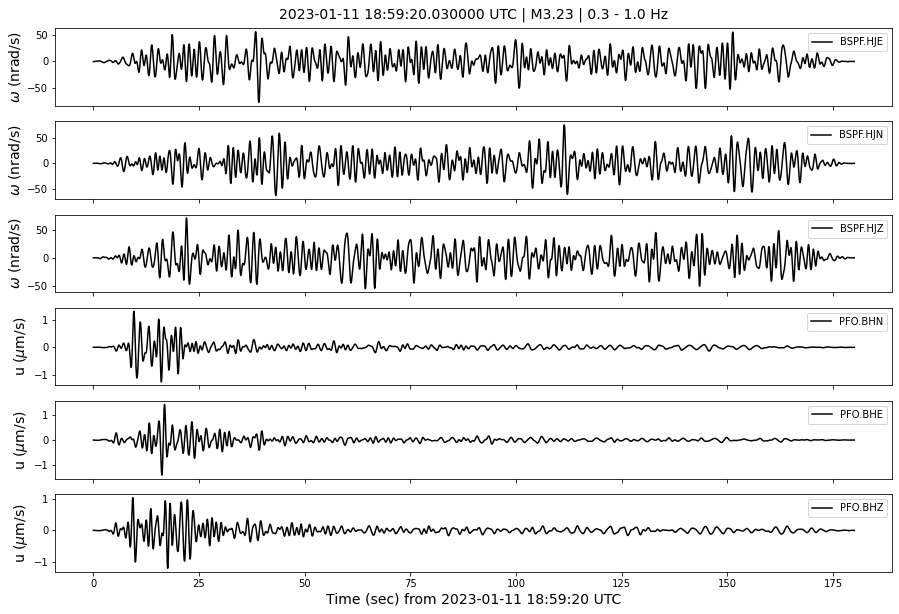


   -> saving ./figs/20230111T185920.030000_traces.png ...

   -> Done


   -> saving ./figs/20230111T185920.030000_spectra.png ...

   -> Done

 -> 1 2023-01-09 19:42:56.460000 
6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-01-09T19:42:56.458300Z - 2023-01-09T19:43:56.458300Z | 200.0 Hz, 12001 samples
PY.BSPF..HJN  | 2023-01-09T19:42:56.458300Z - 2023-01-09T19:43:56.458300Z | 200.0 Hz, 12001 samples
PY.BSPF..HJZ  | 2023-01-09T19:42:56.458300Z - 2023-01-09T19:43:56.458300Z | 200.0 Hz, 12001 samples
II.PFO.10.BHN | 2023-01-09T19:42:56.469539Z - 2023-01-09T19:43:56.469539Z | 40.0 Hz, 2401 samples
II.PFO.10.BHE | 2023-01-09T19:42:56.469539Z - 2023-01-09T19:43:56.469539Z | 40.0 Hz, 2401 samples
II.PFO.10.BHZ | 2023-01-09T19:42:56.469539Z - 2023-01-09T19:43:56.469539Z | 40.0 Hz, 2401 samples


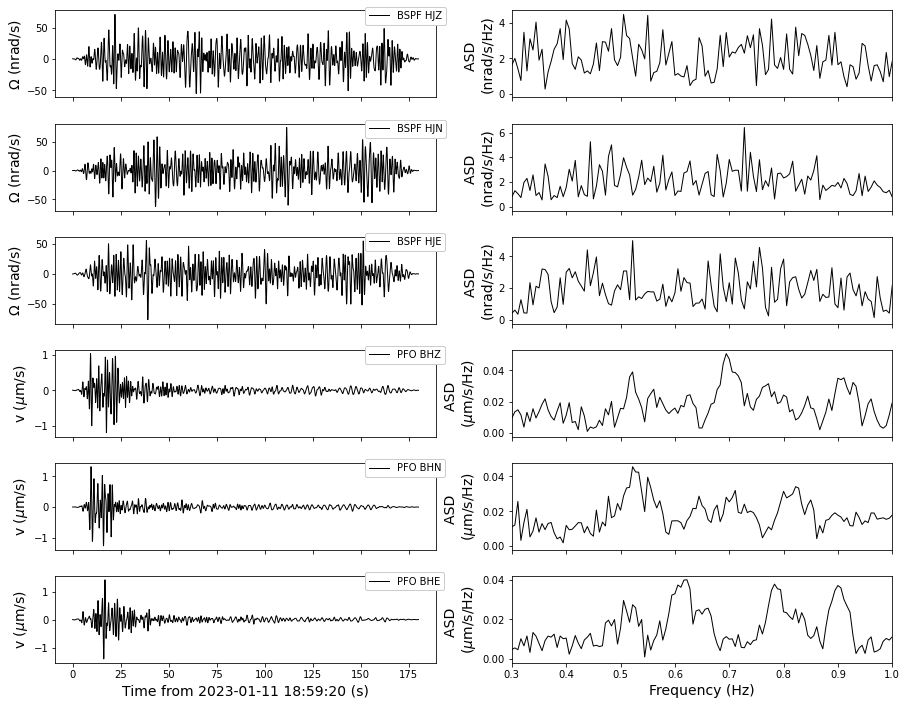

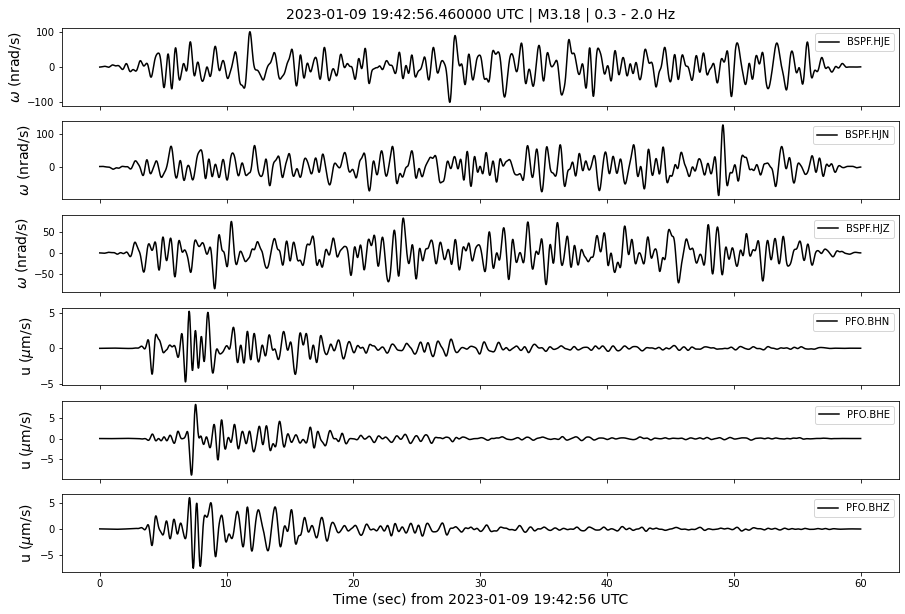


   -> saving ./figs/20230109T194256.460000_traces.png ...

   -> Done


   -> saving ./figs/20230109T194256.460000_spectra.png ...

   -> Done

 -> 2 2023-01-05 10:00:33.030000 
6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-01-05T10:00:33.029100Z - 2023-01-05T10:01:33.029100Z | 200.0 Hz, 12001 samples
PY.BSPF..HJN  | 2023-01-05T10:00:33.029100Z - 2023-01-05T10:01:33.029100Z | 200.0 Hz, 12001 samples
PY.BSPF..HJZ  | 2023-01-05T10:00:33.029100Z - 2023-01-05T10:01:33.029100Z | 200.0 Hz, 12001 samples
II.PFO.10.BHN | 2023-01-05T10:00:33.019538Z - 2023-01-05T10:01:33.019538Z | 40.0 Hz, 2401 samples
II.PFO.10.BHE | 2023-01-05T10:00:33.019538Z - 2023-01-05T10:01:33.019538Z | 40.0 Hz, 2401 samples
II.PFO.10.BHZ | 2023-01-05T10:00:33.019538Z - 2023-01-05T10:01:33.019538Z | 40.0 Hz, 2401 samples


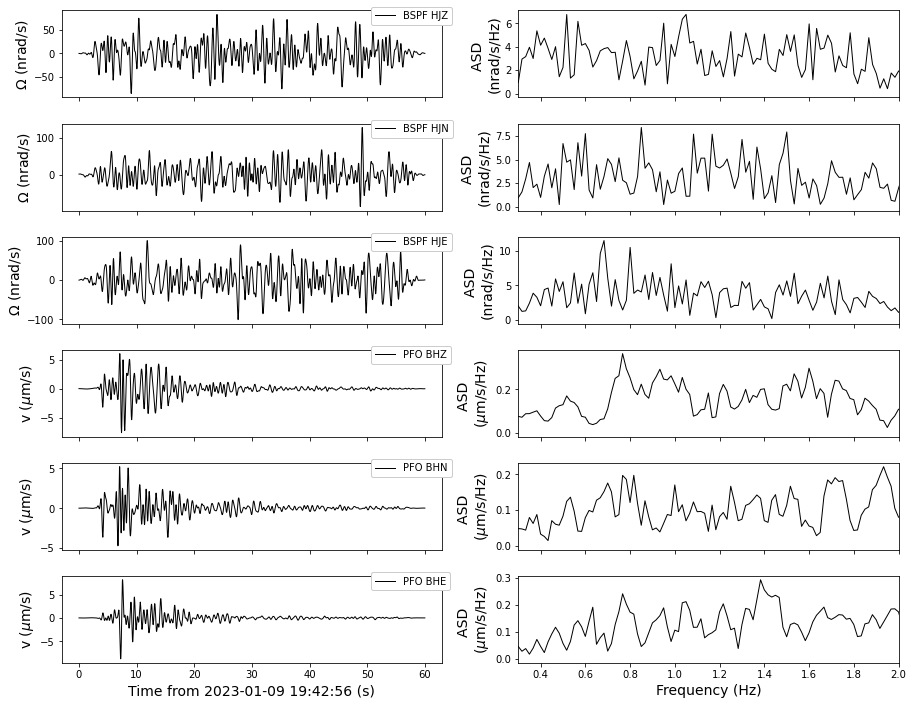

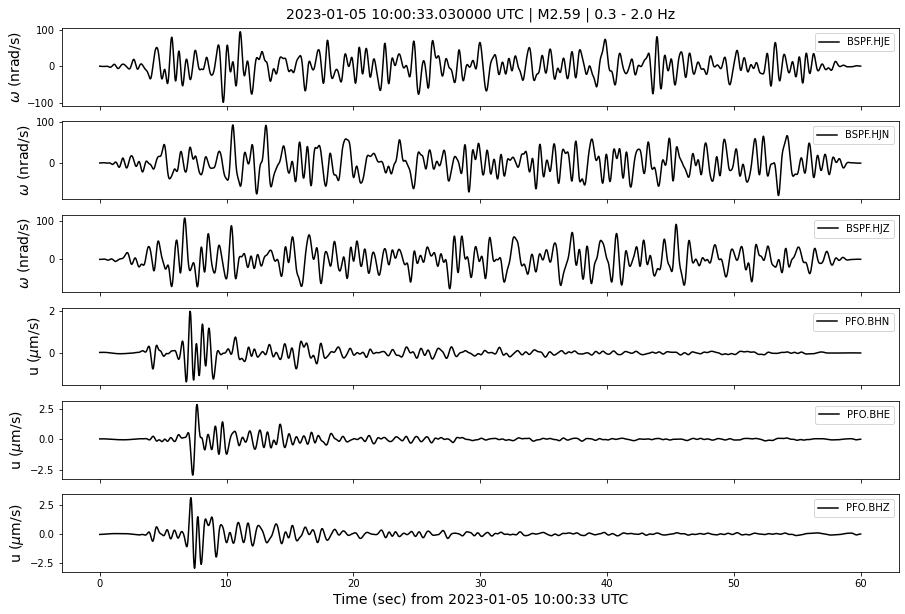


   -> saving ./figs/20230105T100033.030000_traces.png ...

   -> Done


   -> saving ./figs/20230105T100033.030000_spectra.png ...

   -> Done

 -> 3 2023-01-02 03:20:18.170000 
6 Trace(s) in Stream:
PY.BSPF..HJE  | 2023-01-02T03:20:18.169100Z - 2023-01-02T03:21:18.169100Z | 200.0 Hz, 12001 samples
PY.BSPF..HJN  | 2023-01-02T03:20:18.169100Z - 2023-01-02T03:21:18.169100Z | 200.0 Hz, 12001 samples
PY.BSPF..HJZ  | 2023-01-02T03:20:18.169100Z - 2023-01-02T03:21:18.169100Z | 200.0 Hz, 12001 samples
II.PFO.10.BHN | 2023-01-02T03:20:18.169538Z - 2023-01-02T03:21:18.169538Z | 40.0 Hz, 2401 samples
II.PFO.10.BHE | 2023-01-02T03:20:18.169538Z - 2023-01-02T03:21:18.169538Z | 40.0 Hz, 2401 samples
II.PFO.10.BHZ | 2023-01-02T03:20:18.169538Z - 2023-01-02T03:21:18.169538Z | 40.0 Hz, 2401 samples


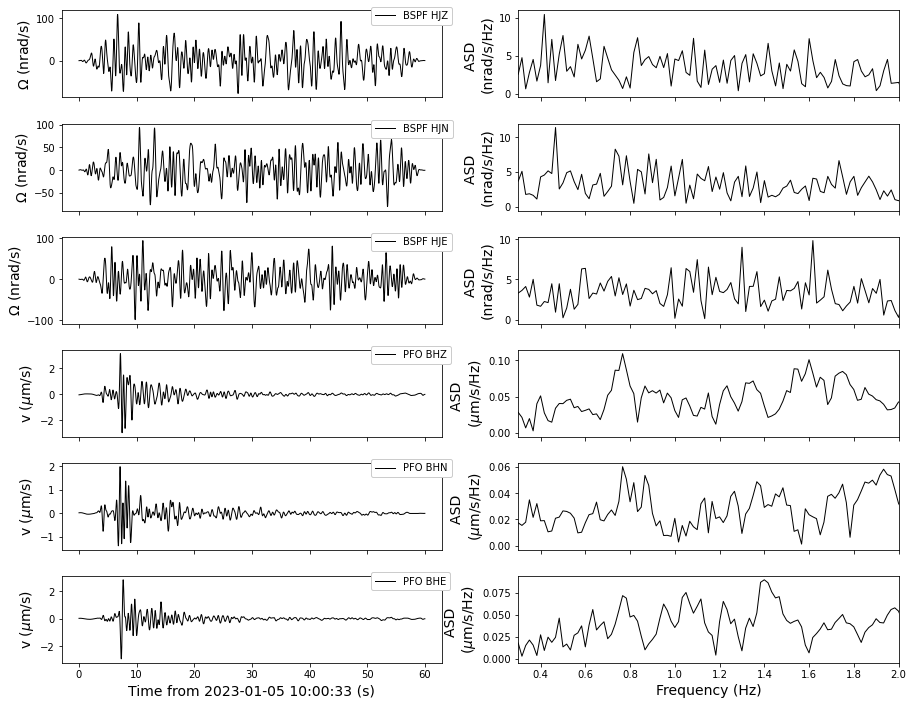

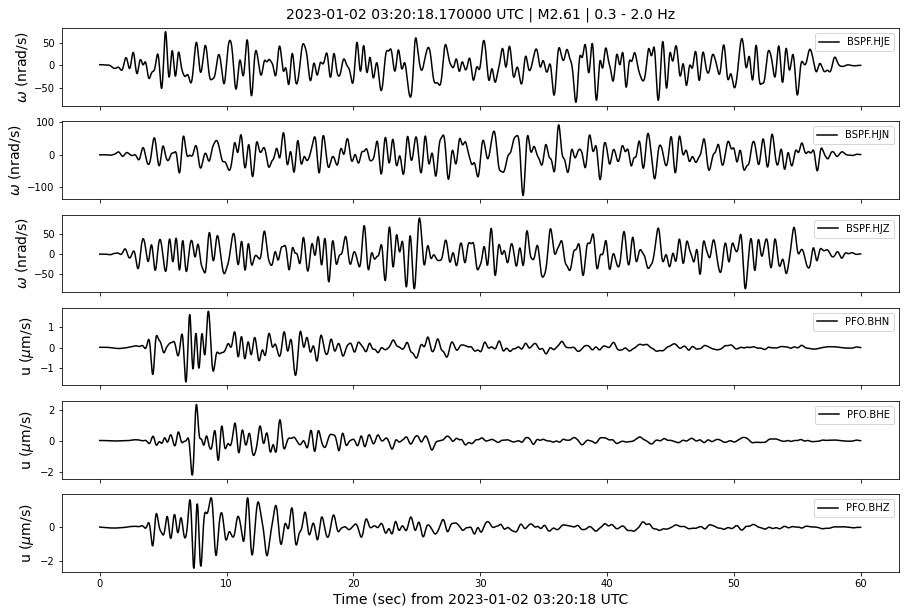


   -> saving ./figs/20230102T032018.170000_traces.png ...

   -> Done


   -> saving ./figs/20230102T032018.170000_spectra.png ...

   -> Done

 -> 4 2022-12-31 12:12:26.650000 
6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-12-31T12:12:26.648700Z - 2022-12-31T12:13:26.648700Z | 200.0 Hz, 12001 samples
PY.BSPF..HJN  | 2022-12-31T12:12:26.648700Z - 2022-12-31T12:13:26.648700Z | 200.0 Hz, 12001 samples
PY.BSPF..HJZ  | 2022-12-31T12:12:26.648700Z - 2022-12-31T12:13:26.648700Z | 200.0 Hz, 12001 samples
II.PFO.10.BHN | 2022-12-31T12:12:26.644538Z - 2022-12-31T12:13:26.644538Z | 40.0 Hz, 2401 samples
II.PFO.10.BHE | 2022-12-31T12:12:26.644538Z - 2022-12-31T12:13:26.644538Z | 40.0 Hz, 2401 samples
II.PFO.10.BHZ | 2022-12-31T12:12:26.644538Z - 2022-12-31T12:13:26.644538Z | 40.0 Hz, 2401 samples


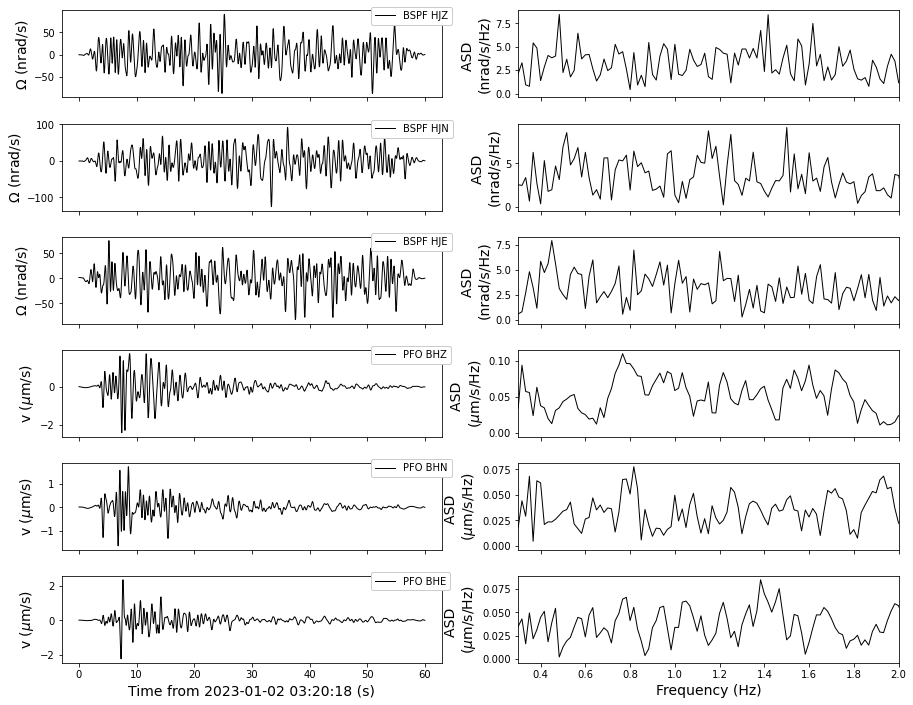

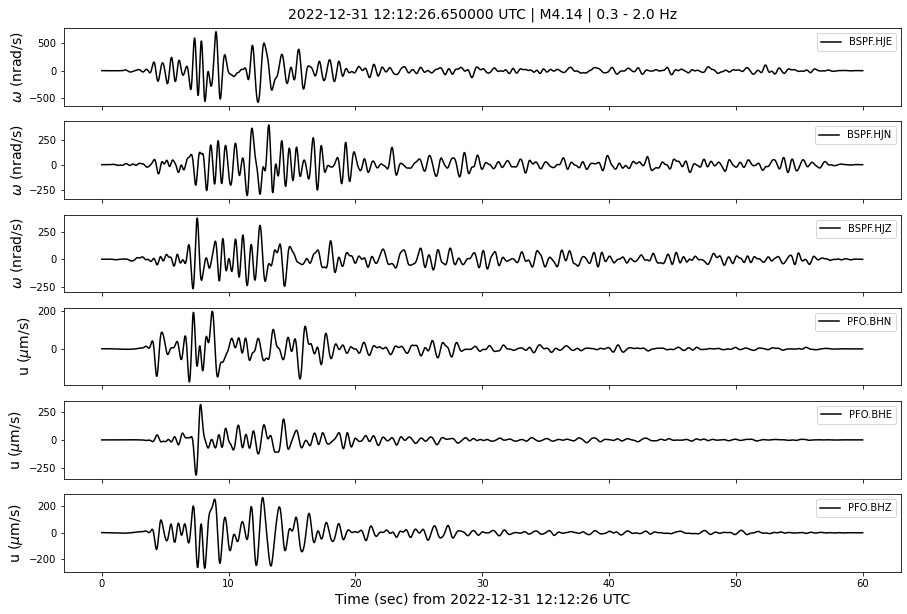


   -> saving ./figs/20221231T121226.650000_traces.png ...

   -> Done


   -> saving ./figs/20221231T121226.650000_spectra.png ...

   -> Done

 -> 5 2022-12-31 11:41:09.460000 
6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-12-31T11:41:09.458700Z - 2022-12-31T11:44:09.458700Z | 200.0 Hz, 36001 samples
PY.BSPF..HJN  | 2022-12-31T11:41:09.458700Z - 2022-12-31T11:44:09.458700Z | 200.0 Hz, 36001 samples
PY.BSPF..HJZ  | 2022-12-31T11:41:09.458700Z - 2022-12-31T11:44:09.458700Z | 200.0 Hz, 36001 samples
II.PFO.10.BHN | 2022-12-31T11:41:09.469538Z - 2022-12-31T11:44:09.469538Z | 40.0 Hz, 7201 samples
II.PFO.10.BHE | 2022-12-31T11:41:09.469538Z - 2022-12-31T11:44:09.469538Z | 40.0 Hz, 7201 samples
II.PFO.10.BHZ | 2022-12-31T11:41:09.469538Z - 2022-12-31T11:44:09.469538Z | 40.0 Hz, 7201 samples


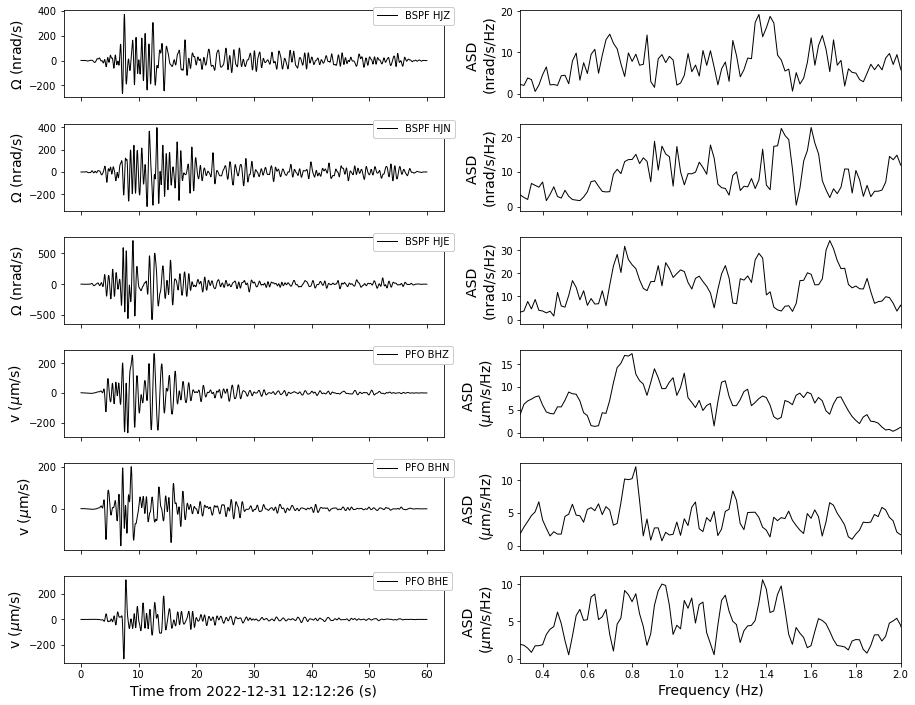

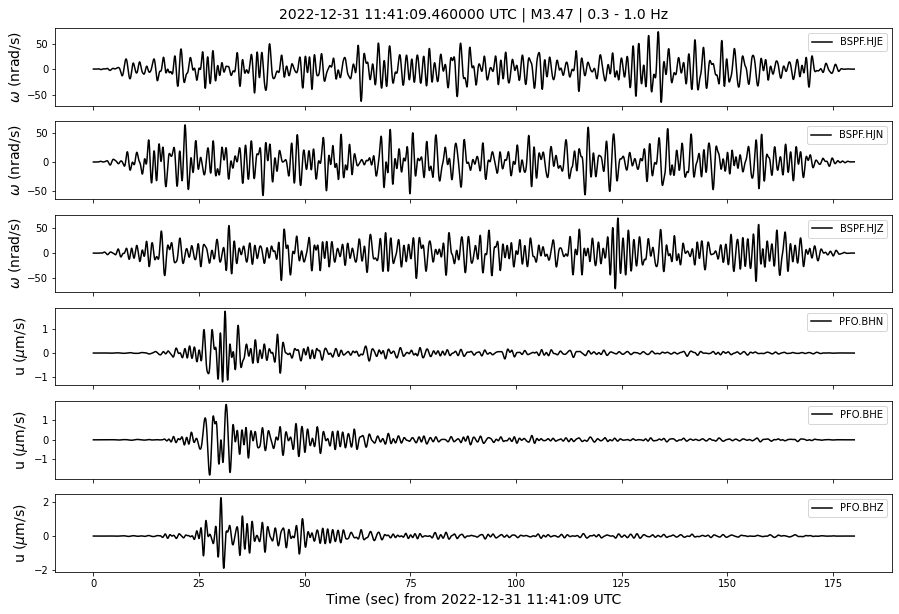


   -> saving ./figs/20221231T114109.460000_traces.png ...

   -> Done


   -> saving ./figs/20221231T114109.460000_spectra.png ...

   -> Done

 -> 6 2022-12-28 00:55:24.090000 
6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-12-28T00:55:24.088800Z - 2022-12-28T00:58:24.088800Z | 200.0 Hz, 36001 samples
PY.BSPF..HJN  | 2022-12-28T00:55:24.088800Z - 2022-12-28T00:58:24.088800Z | 200.0 Hz, 36001 samples
PY.BSPF..HJZ  | 2022-12-28T00:55:24.088800Z - 2022-12-28T00:58:24.088800Z | 200.0 Hz, 36001 samples
II.PFO.10.BHN | 2022-12-28T00:55:24.094538Z - 2022-12-28T00:58:24.094538Z | 40.0 Hz, 7201 samples
II.PFO.10.BHE | 2022-12-28T00:55:24.094538Z - 2022-12-28T00:58:24.094538Z | 40.0 Hz, 7201 samples
II.PFO.10.BHZ | 2022-12-28T00:55:24.094538Z - 2022-12-28T00:58:24.094538Z | 40.0 Hz, 7201 samples


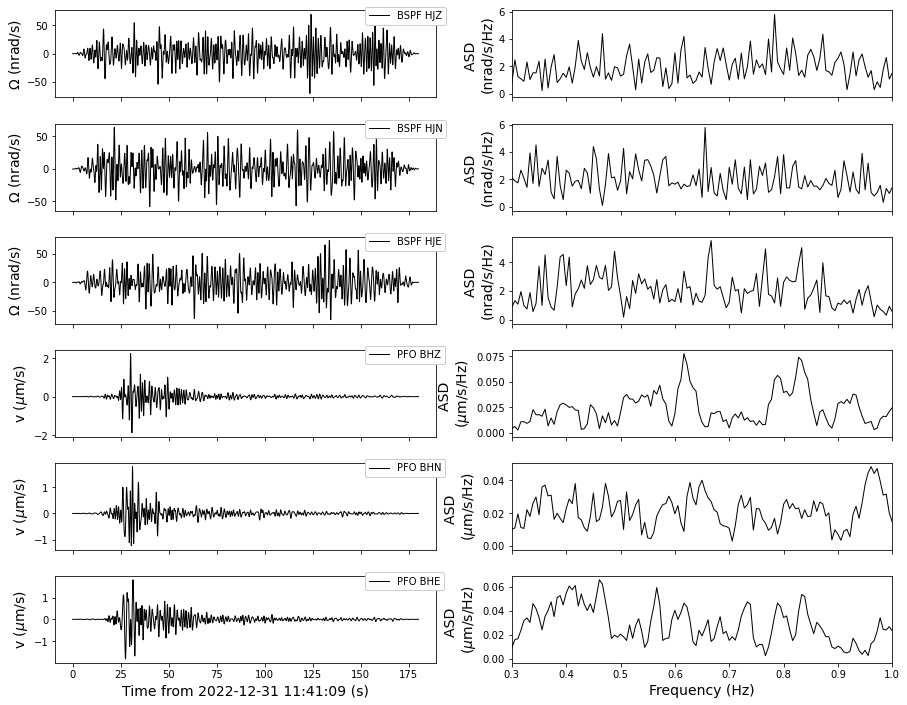

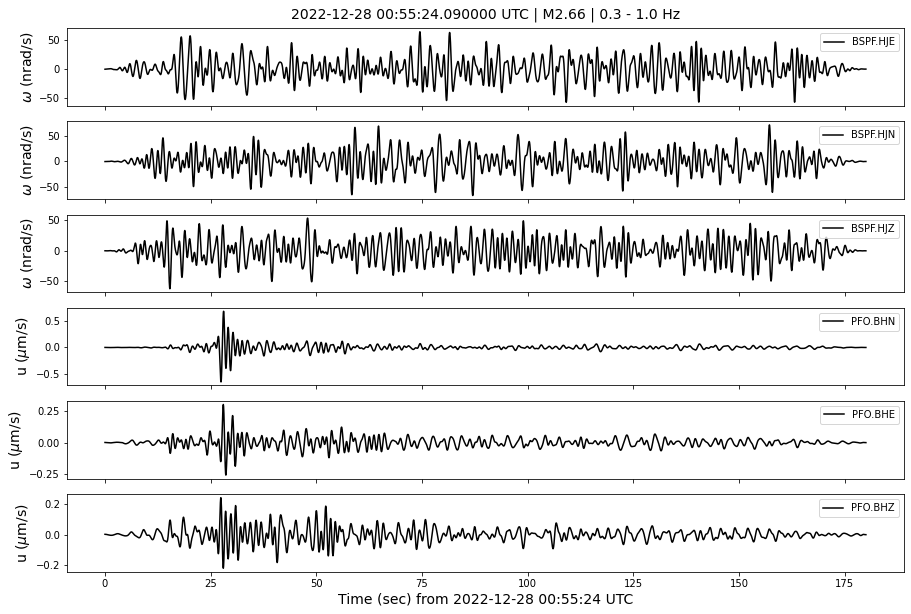


   -> saving ./figs/20221228T005524.090000_traces.png ...

   -> Done


   -> saving ./figs/20221228T005524.090000_spectra.png ...

   -> Done

 -> 7 2022-12-27 14:50:47.040000 
6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-12-27T14:50:47.038800Z - 2022-12-27T14:53:47.038800Z | 200.0 Hz, 36001 samples
PY.BSPF..HJN  | 2022-12-27T14:50:47.038800Z - 2022-12-27T14:53:47.038800Z | 200.0 Hz, 36001 samples
PY.BSPF..HJZ  | 2022-12-27T14:50:47.038800Z - 2022-12-27T14:53:47.038800Z | 200.0 Hz, 36001 samples
II.PFO.10.BHN | 2022-12-27T14:50:47.044538Z - 2022-12-27T14:53:47.044538Z | 40.0 Hz, 7201 samples
II.PFO.10.BHE | 2022-12-27T14:50:47.044538Z - 2022-12-27T14:53:47.044538Z | 40.0 Hz, 7201 samples
II.PFO.10.BHZ | 2022-12-27T14:50:47.044538Z - 2022-12-27T14:53:47.044538Z | 40.0 Hz, 7201 samples


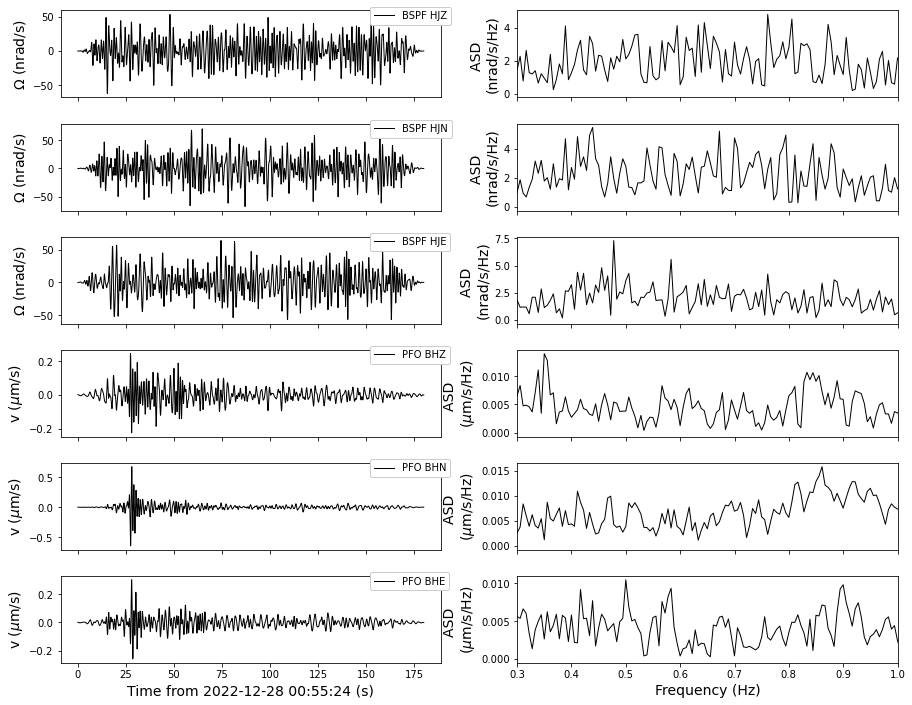

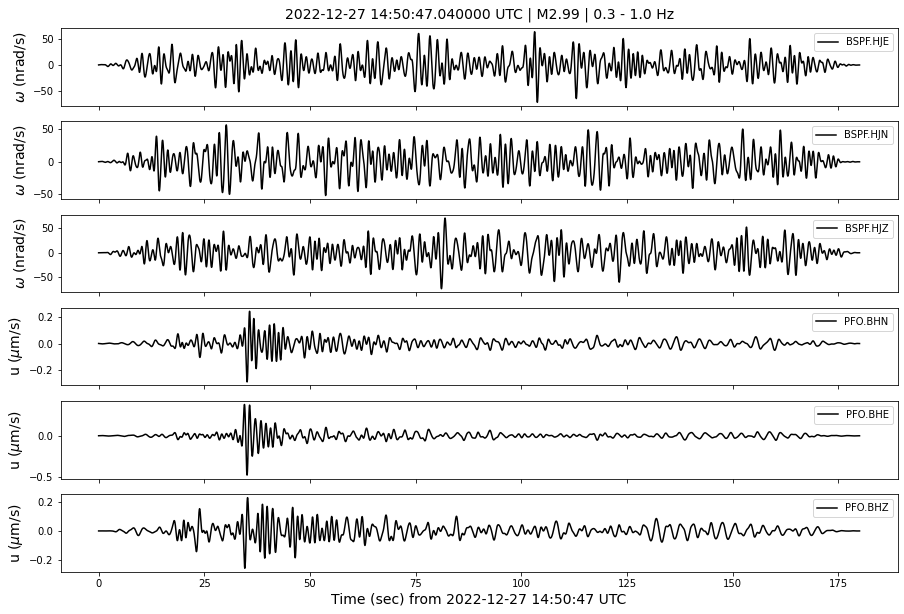


   -> saving ./figs/20221227T145047.040000_traces.png ...

   -> Done


   -> saving ./figs/20221227T145047.040000_spectra.png ...

   -> Done

 -> 8 2022-12-25 18:53:13.340000 
6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-12-25T18:53:13.338700Z - 2022-12-25T18:56:13.338700Z | 200.0 Hz, 36001 samples
PY.BSPF..HJN  | 2022-12-25T18:53:13.338700Z - 2022-12-25T18:56:13.338700Z | 200.0 Hz, 36001 samples
PY.BSPF..HJZ  | 2022-12-25T18:53:13.338700Z - 2022-12-25T18:56:13.338700Z | 200.0 Hz, 36001 samples
II.PFO.10.BHN | 2022-12-25T18:53:13.344538Z - 2022-12-25T18:56:13.344538Z | 40.0 Hz, 7201 samples
II.PFO.10.BHE | 2022-12-25T18:53:13.344538Z - 2022-12-25T18:56:13.344538Z | 40.0 Hz, 7201 samples
II.PFO.10.BHZ | 2022-12-25T18:53:13.344538Z - 2022-12-25T18:56:13.344538Z | 40.0 Hz, 7201 samples


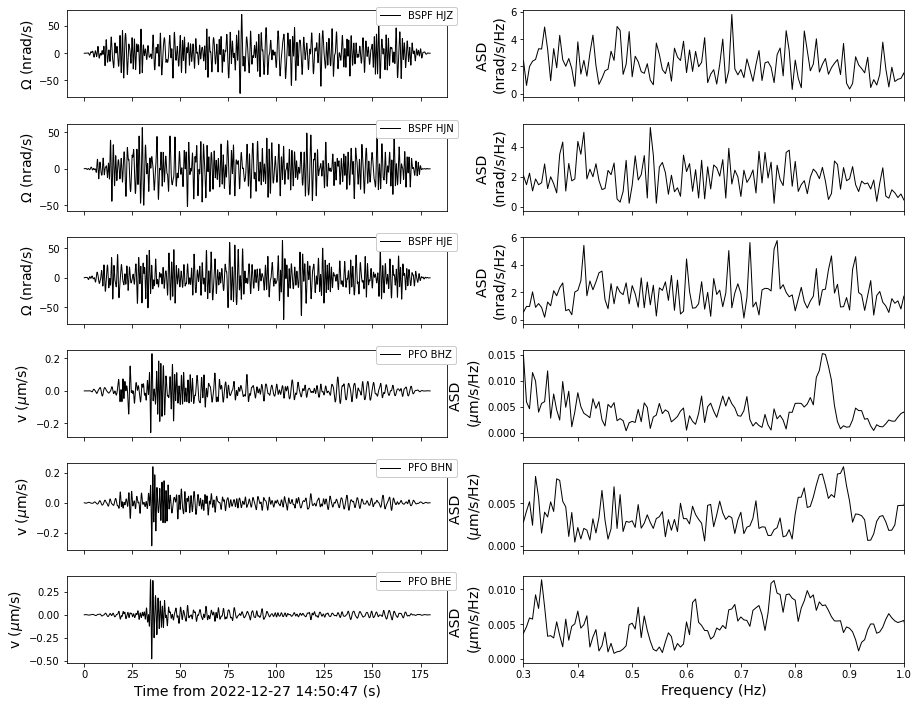

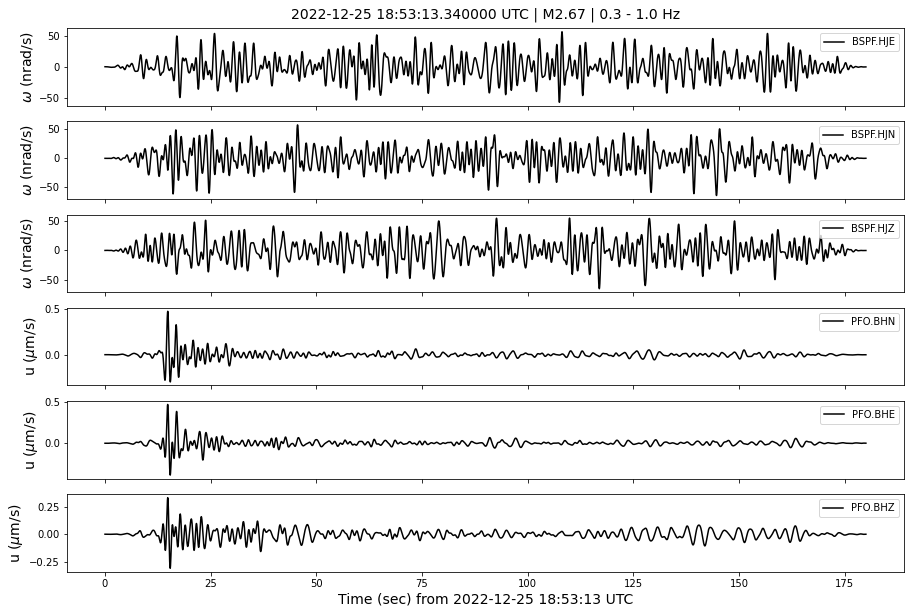


   -> saving ./figs/20221225T185313.340000_traces.png ...

   -> Done


   -> saving ./figs/20221225T185313.340000_spectra.png ...

   -> Done

 -> 9 2022-12-25 08:40:38.710000 
6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-12-25T08:40:38.708800Z - 2022-12-25T08:43:38.708800Z | 200.0 Hz, 36001 samples
PY.BSPF..HJN  | 2022-12-25T08:40:38.708800Z - 2022-12-25T08:43:38.708800Z | 200.0 Hz, 36001 samples
PY.BSPF..HJZ  | 2022-12-25T08:40:38.708800Z - 2022-12-25T08:43:38.708800Z | 200.0 Hz, 36001 samples
II.PFO.10.BHN | 2022-12-25T08:40:38.719536Z - 2022-12-25T08:43:38.719536Z | 40.0 Hz, 7201 samples
II.PFO.10.BHE | 2022-12-25T08:40:38.719536Z - 2022-12-25T08:43:38.719536Z | 40.0 Hz, 7201 samples
II.PFO.10.BHZ | 2022-12-25T08:40:38.719536Z - 2022-12-25T08:43:38.719536Z | 40.0 Hz, 7201 samples


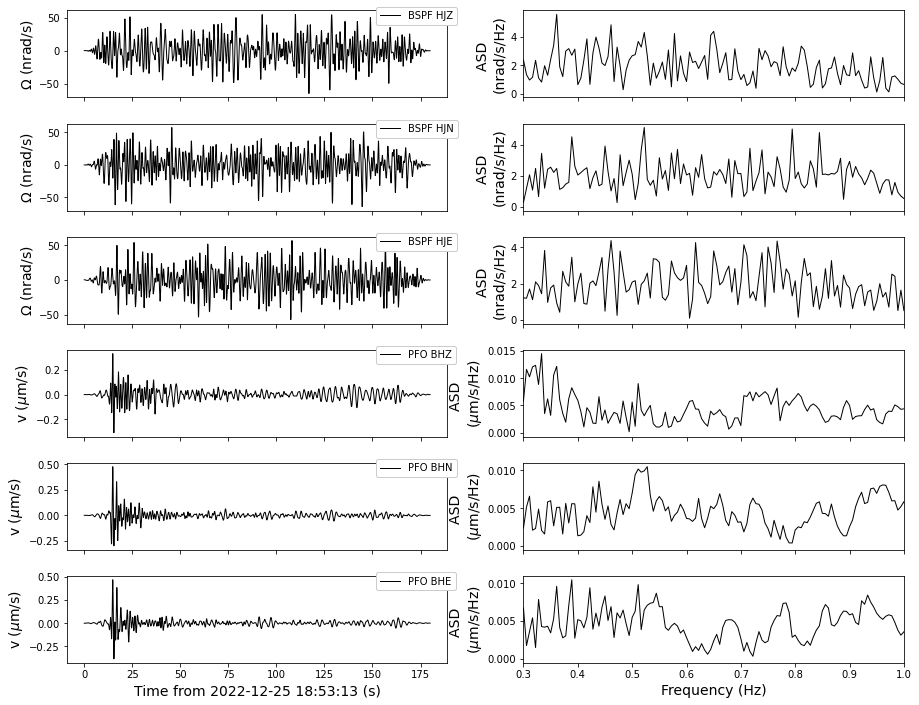

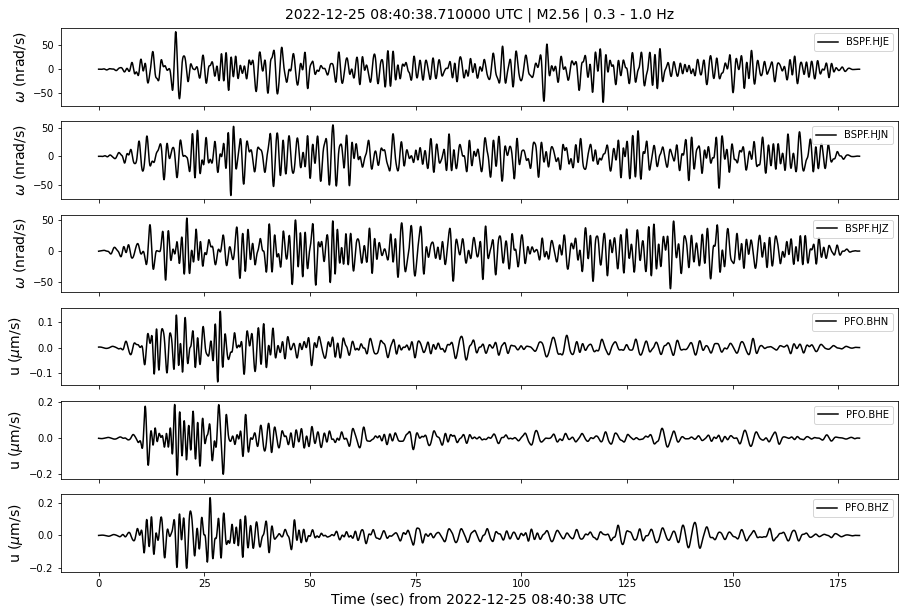


   -> saving ./figs/20221225T084038.710000_traces.png ...

   -> Done


   -> saving ./figs/20221225T084038.710000_spectra.png ...

   -> Done

 -> 10 2022-12-21 00:46:14.410000 
6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-12-21T00:46:14.408900Z - 2022-12-21T00:49:14.408900Z | 200.0 Hz, 36001 samples
PY.BSPF..HJN  | 2022-12-21T00:46:14.408900Z - 2022-12-21T00:49:14.408900Z | 200.0 Hz, 36001 samples
PY.BSPF..HJZ  | 2022-12-21T00:46:14.408900Z - 2022-12-21T00:49:14.408900Z | 200.0 Hz, 36001 samples
II.PFO.10.BHN | 2022-12-21T00:46:14.419538Z - 2022-12-21T00:49:14.419538Z | 40.0 Hz, 7201 samples
II.PFO.10.BHE | 2022-12-21T00:46:14.419538Z - 2022-12-21T00:49:14.419538Z | 40.0 Hz, 7201 samples
II.PFO.10.BHZ | 2022-12-21T00:46:14.419538Z - 2022-12-21T00:49:14.419538Z | 40.0 Hz, 7201 samples


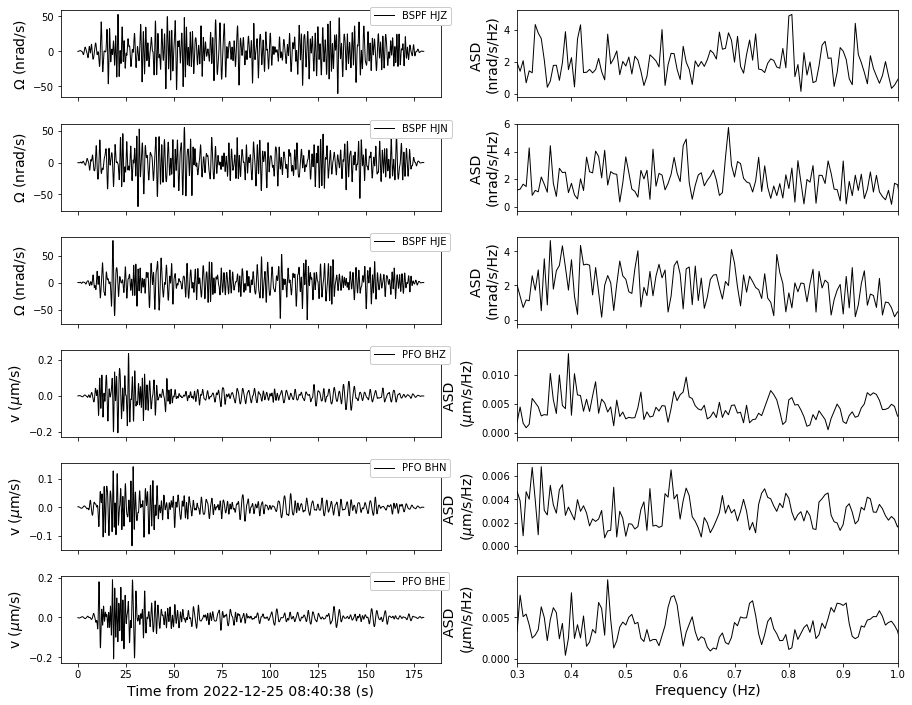

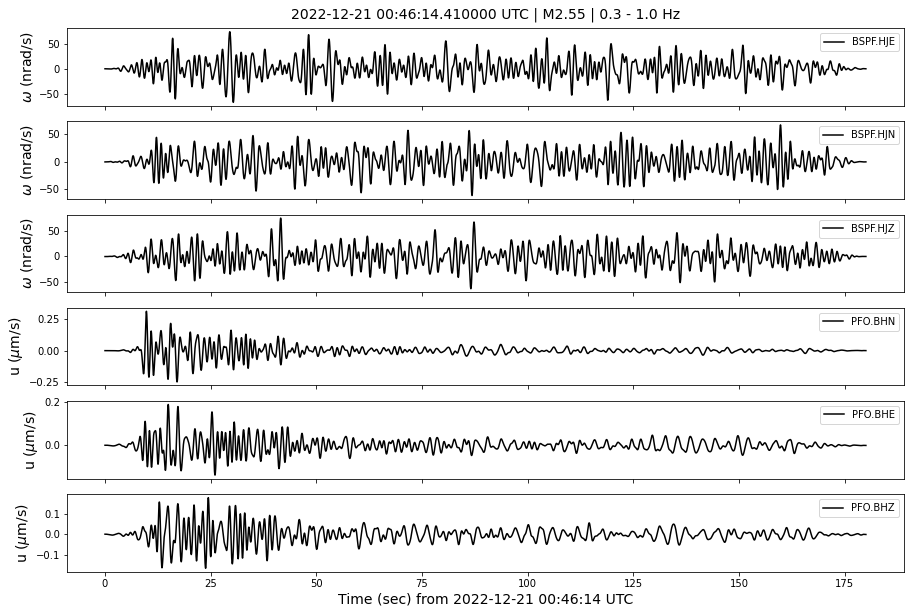


   -> saving ./figs/20221221T004614.410000_traces.png ...

   -> Done


   -> saving ./figs/20221221T004614.410000_spectra.png ...

   -> Done

 -> 11 2022-12-16 03:26:49.190000 
6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-12-16T03:26:49.191200Z - 2022-12-16T03:29:49.191200Z | 200.0 Hz, 36001 samples
PY.BSPF..HJN  | 2022-12-16T03:26:49.191200Z - 2022-12-16T03:29:49.191200Z | 200.0 Hz, 36001 samples
PY.BSPF..HJZ  | 2022-12-16T03:26:49.191200Z - 2022-12-16T03:29:49.191200Z | 200.0 Hz, 36001 samples
II.PFO.10.BHN | 2022-12-16T03:26:49.194538Z - 2022-12-16T03:29:49.194538Z | 40.0 Hz, 7201 samples
II.PFO.10.BHE | 2022-12-16T03:26:49.194538Z - 2022-12-16T03:29:49.194538Z | 40.0 Hz, 7201 samples
II.PFO.10.BHZ | 2022-12-16T03:26:49.194538Z - 2022-12-16T03:29:49.194538Z | 40.0 Hz, 7201 samples


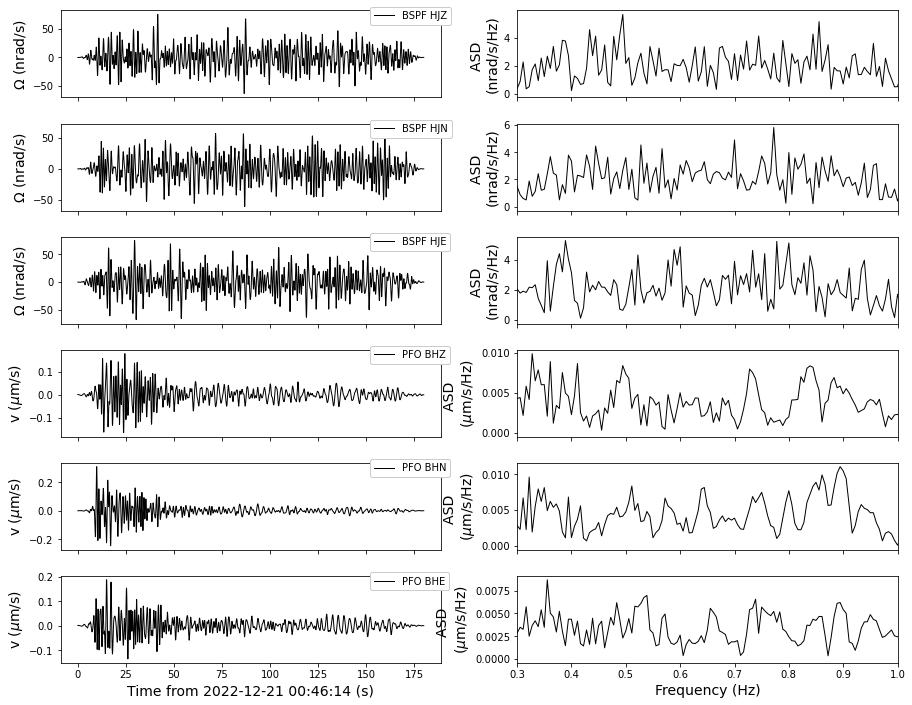

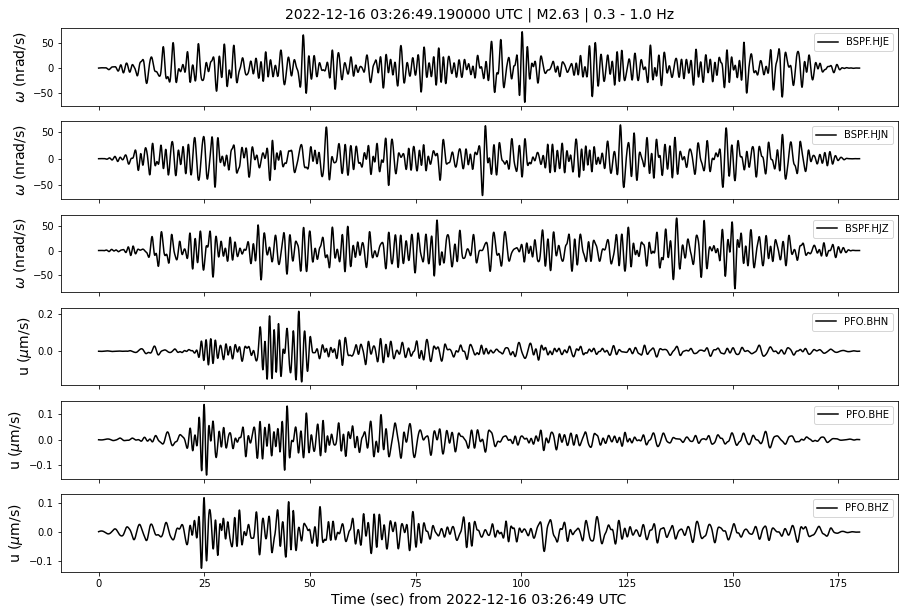


   -> saving ./figs/20221216T032649.190000_traces.png ...

   -> Done


   -> saving ./figs/20221216T032649.190000_spectra.png ...

   -> Done

 -> 12 2022-12-15 22:08:53.140000 
6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-12-15T22:08:53.141200Z - 2022-12-15T22:11:53.141200Z | 200.0 Hz, 36001 samples
PY.BSPF..HJN  | 2022-12-15T22:08:53.141200Z - 2022-12-15T22:11:53.141200Z | 200.0 Hz, 36001 samples
PY.BSPF..HJZ  | 2022-12-15T22:08:53.141200Z - 2022-12-15T22:11:53.141200Z | 200.0 Hz, 36001 samples
II.PFO.10.BHN | 2022-12-15T22:08:53.144536Z - 2022-12-15T22:11:53.144536Z | 40.0 Hz, 7201 samples
II.PFO.10.BHE | 2022-12-15T22:08:53.144536Z - 2022-12-15T22:11:53.144536Z | 40.0 Hz, 7201 samples
II.PFO.10.BHZ | 2022-12-15T22:08:53.144536Z - 2022-12-15T22:11:53.144536Z | 40.0 Hz, 7201 samples


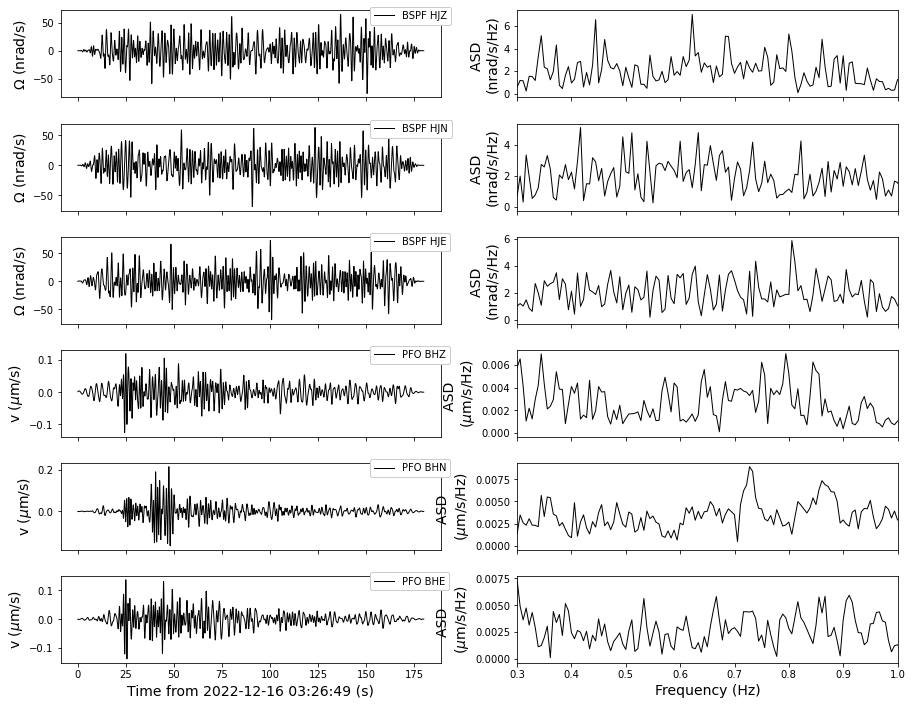

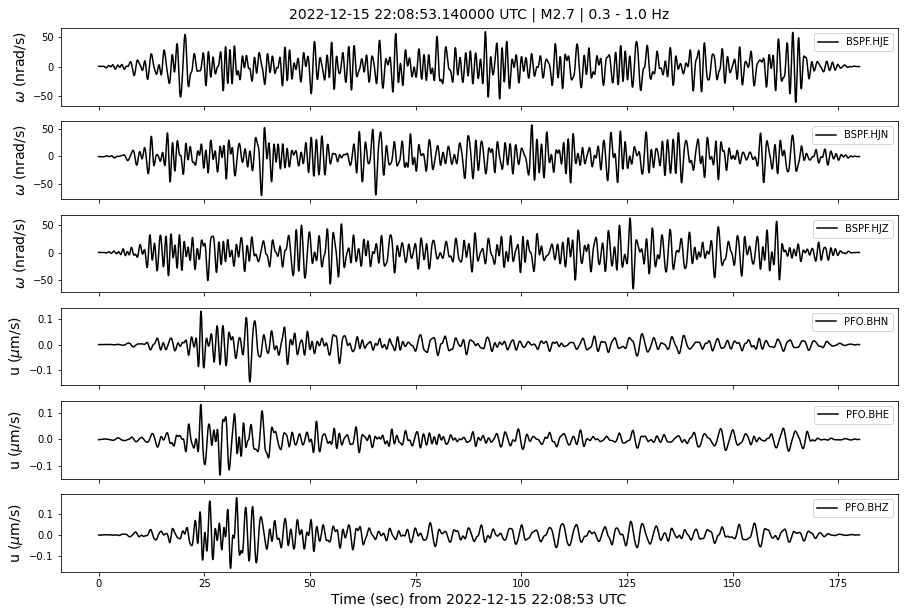


   -> saving ./figs/20221215T220853.140000_traces.png ...

   -> Done


   -> saving ./figs/20221215T220853.140000_spectra.png ...

   -> Done

 -> 13 2022-12-09 06:03:03.220000 
6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-12-09T06:03:03.221000Z - 2022-12-09T06:06:03.221000Z | 200.0 Hz, 36001 samples
PY.BSPF..HJN  | 2022-12-09T06:03:03.221000Z - 2022-12-09T06:06:03.221000Z | 200.0 Hz, 36001 samples
PY.BSPF..HJZ  | 2022-12-09T06:03:03.221000Z - 2022-12-09T06:06:03.221000Z | 200.0 Hz, 36001 samples
II.PFO.10.BHN | 2022-12-09T06:03:03.219539Z - 2022-12-09T06:06:03.219539Z | 40.0 Hz, 7201 samples
II.PFO.10.BHE | 2022-12-09T06:03:03.219539Z - 2022-12-09T06:06:03.219539Z | 40.0 Hz, 7201 samples
II.PFO.10.BHZ | 2022-12-09T06:03:03.219539Z - 2022-12-09T06:06:03.219539Z | 40.0 Hz, 7201 samples


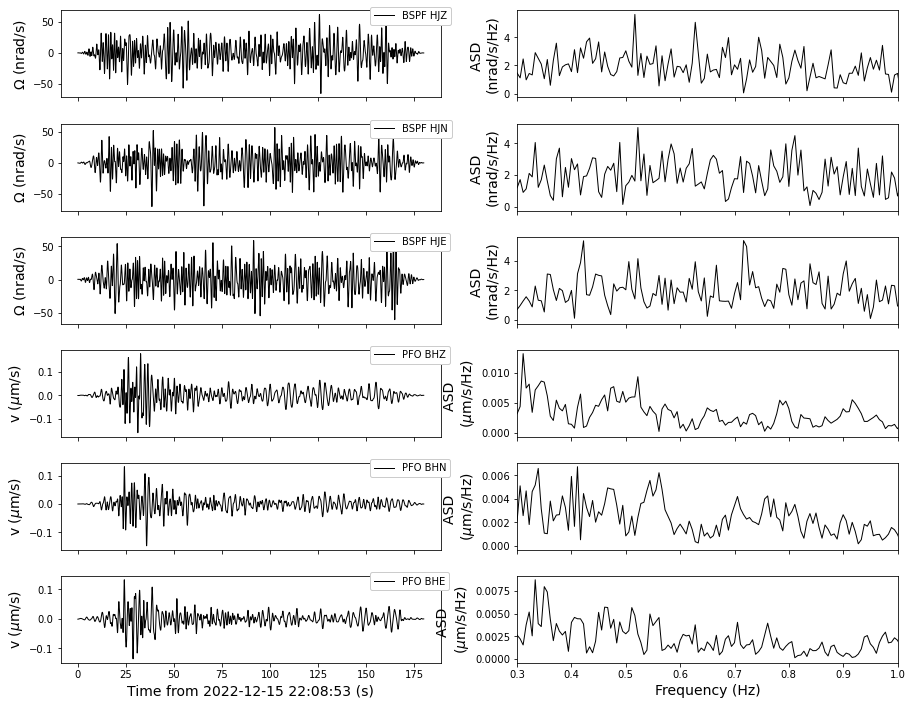

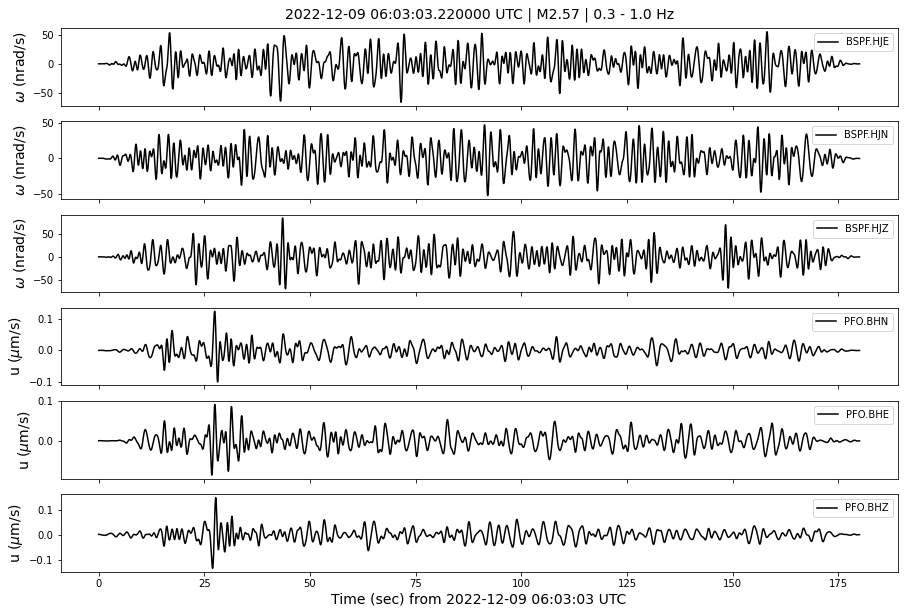


   -> saving ./figs/20221209T060303.220000_traces.png ...

   -> Done


   -> saving ./figs/20221209T060303.220000_spectra.png ...

   -> Done

 -> 14 2022-12-07 21:47:06.790000 
6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-12-07T21:47:06.791000Z - 2022-12-07T21:50:06.791000Z | 200.0 Hz, 36001 samples
PY.BSPF..HJN  | 2022-12-07T21:47:06.791000Z - 2022-12-07T21:50:06.791000Z | 200.0 Hz, 36001 samples
PY.BSPF..HJZ  | 2022-12-07T21:47:06.791000Z - 2022-12-07T21:50:06.791000Z | 200.0 Hz, 36001 samples
II.PFO.10.BHN | 2022-12-07T21:47:06.794538Z - 2022-12-07T21:50:06.794538Z | 40.0 Hz, 7201 samples
II.PFO.10.BHE | 2022-12-07T21:47:06.794538Z - 2022-12-07T21:50:06.794538Z | 40.0 Hz, 7201 samples
II.PFO.10.BHZ | 2022-12-07T21:47:06.794538Z - 2022-12-07T21:50:06.794538Z | 40.0 Hz, 7201 samples


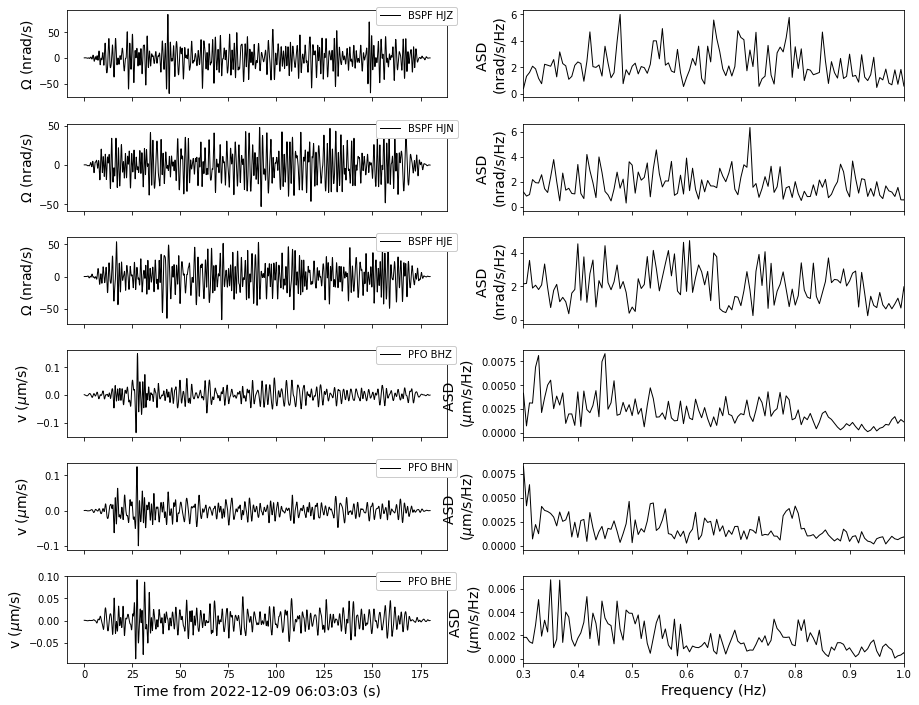

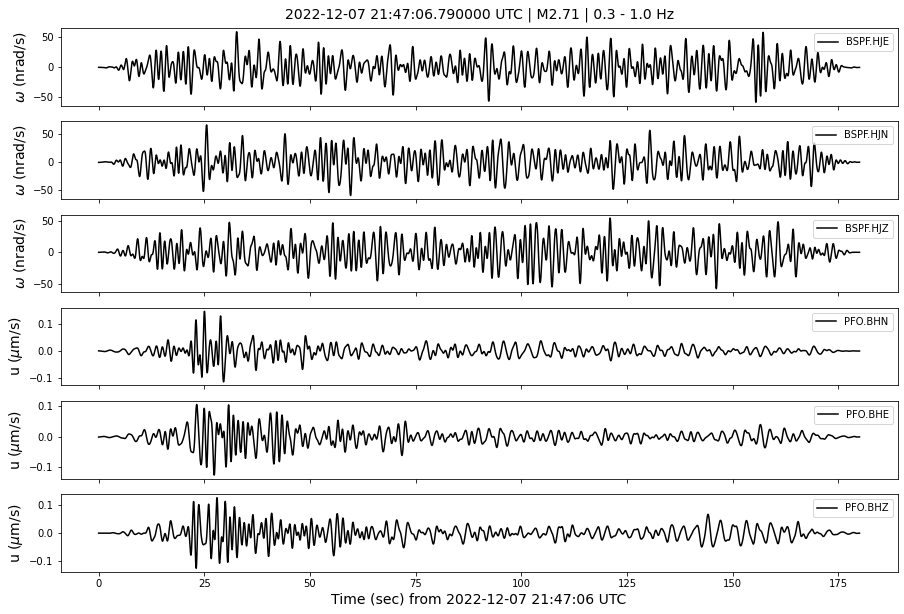


   -> saving ./figs/20221207T214706.790000_traces.png ...

   -> Done


   -> saving ./figs/20221207T214706.790000_spectra.png ...

   -> Done

 -> 15 2022-12-02 10:04:58 
6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-12-02T10:04:58.001200Z - 2022-12-02T10:07:58.001200Z | 200.0 Hz, 36001 samples
PY.BSPF..HJN  | 2022-12-02T10:04:58.001200Z - 2022-12-02T10:07:58.001200Z | 200.0 Hz, 36001 samples
PY.BSPF..HJZ  | 2022-12-02T10:04:58.001200Z - 2022-12-02T10:07:58.001200Z | 200.0 Hz, 36001 samples
II.PFO.10.BHN | 2022-12-02T10:04:57.994538Z - 2022-12-02T10:07:57.994538Z | 40.0 Hz, 7201 samples
II.PFO.10.BHE | 2022-12-02T10:04:57.994538Z - 2022-12-02T10:07:57.994538Z | 40.0 Hz, 7201 samples
II.PFO.10.BHZ | 2022-12-02T10:04:57.994538Z - 2022-12-02T10:07:57.994538Z | 40.0 Hz, 7201 samples


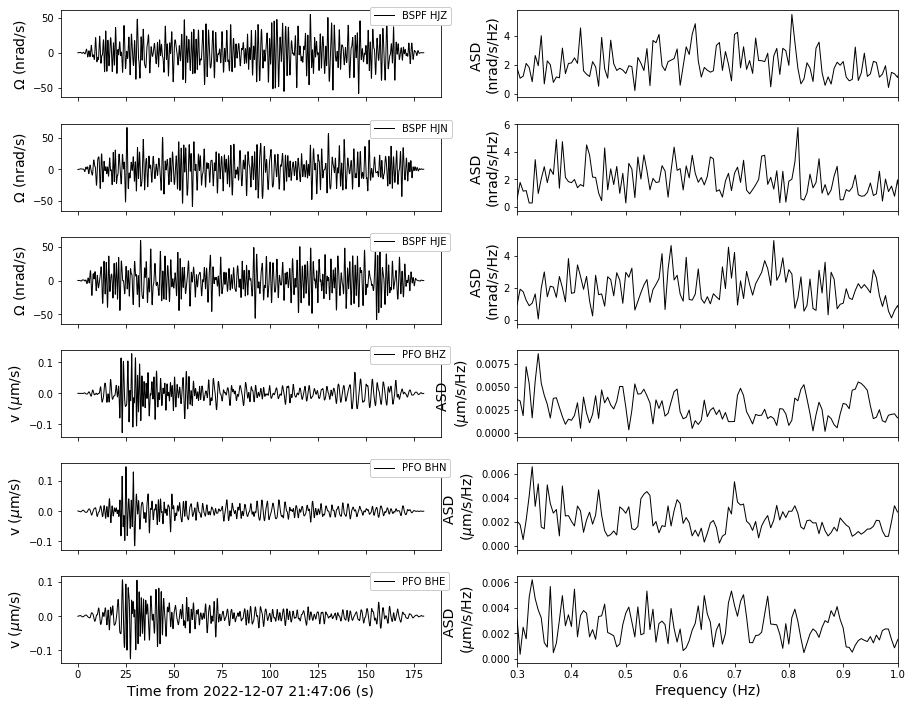

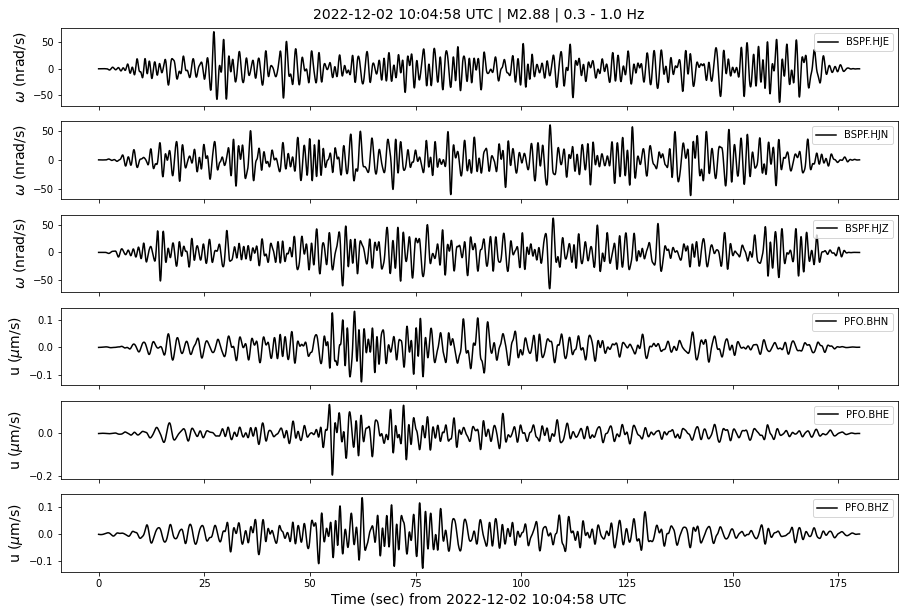


   -> saving ./figs/20221202T100458_traces.png ...

   -> Done


   -> saving ./figs/20221202T100458_spectra.png ...

   -> Done

 -> 16 2022-12-01 15:28:29.660000 
6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-12-01T15:28:29.661200Z - 2022-12-01T15:31:29.661200Z | 200.0 Hz, 36001 samples
PY.BSPF..HJN  | 2022-12-01T15:28:29.661200Z - 2022-12-01T15:31:29.661200Z | 200.0 Hz, 36001 samples
PY.BSPF..HJZ  | 2022-12-01T15:28:29.661200Z - 2022-12-01T15:31:29.661200Z | 200.0 Hz, 36001 samples
II.PFO.10.BHN | 2022-12-01T15:28:29.669539Z - 2022-12-01T15:31:29.669539Z | 40.0 Hz, 7201 samples
II.PFO.10.BHE | 2022-12-01T15:28:29.669539Z - 2022-12-01T15:31:29.669539Z | 40.0 Hz, 7201 samples
II.PFO.10.BHZ | 2022-12-01T15:28:29.669539Z - 2022-12-01T15:31:29.669539Z | 40.0 Hz, 7201 samples


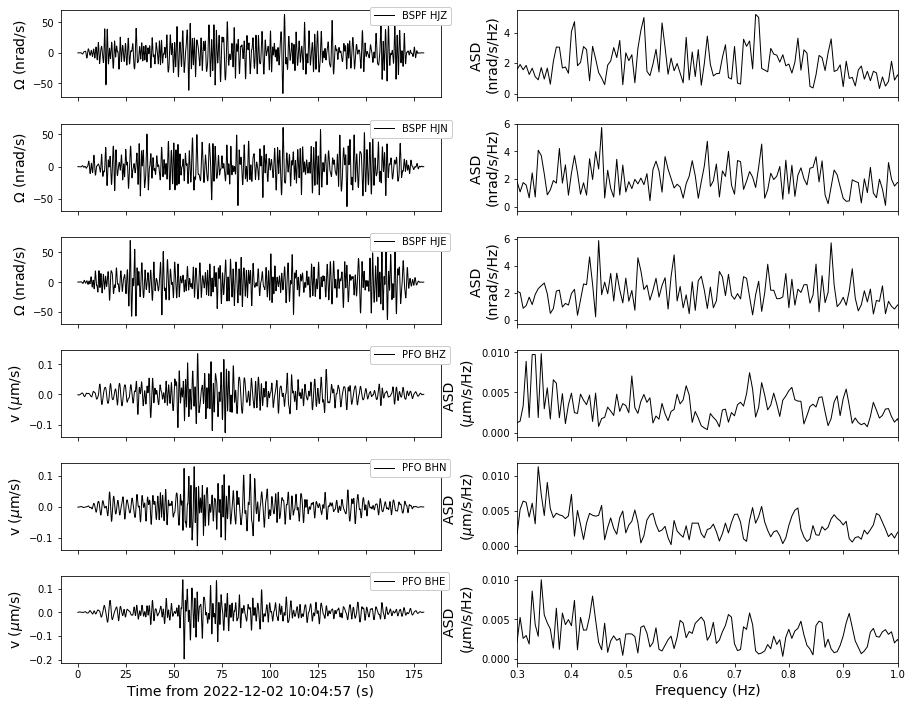

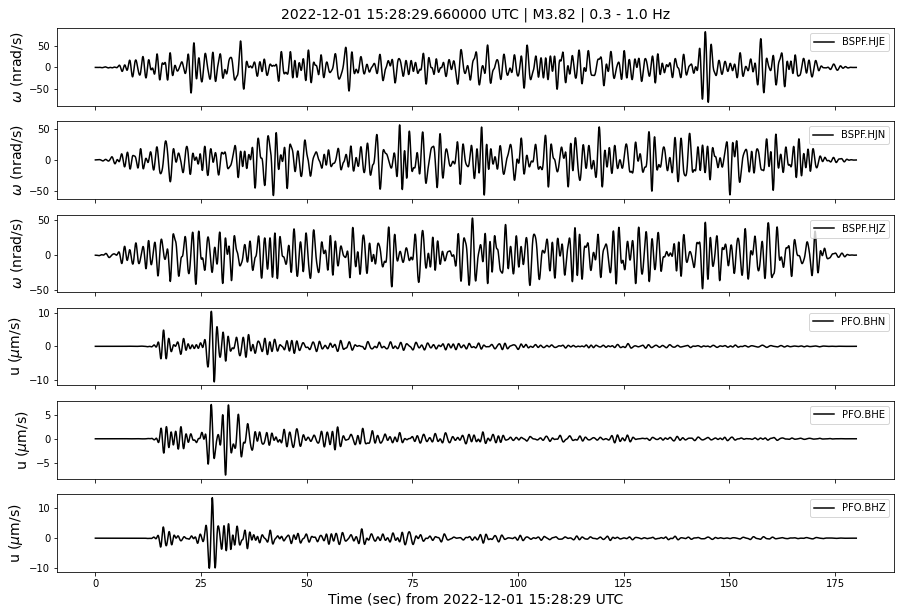


   -> saving ./figs/20221201T152829.660000_traces.png ...

   -> Done


   -> saving ./figs/20221201T152829.660000_spectra.png ...

   -> Done

 -> 17 2022-11-27 11:49:45.090000 
6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-11-27T11:49:45.091100Z - 2022-11-27T11:52:45.091100Z | 200.0 Hz, 36001 samples
PY.BSPF..HJN  | 2022-11-27T11:49:45.091100Z - 2022-11-27T11:52:45.091100Z | 200.0 Hz, 36001 samples
PY.BSPF..HJZ  | 2022-11-27T11:49:45.091100Z - 2022-11-27T11:52:45.091100Z | 200.0 Hz, 36001 samples
II.PFO.10.BHN | 2022-11-27T11:49:45.094538Z - 2022-11-27T11:52:45.094538Z | 40.0 Hz, 7201 samples
II.PFO.10.BHE | 2022-11-27T11:49:45.094538Z - 2022-11-27T11:52:45.094538Z | 40.0 Hz, 7201 samples
II.PFO.10.BHZ | 2022-11-27T11:49:45.094538Z - 2022-11-27T11:52:45.094538Z | 40.0 Hz, 7201 samples


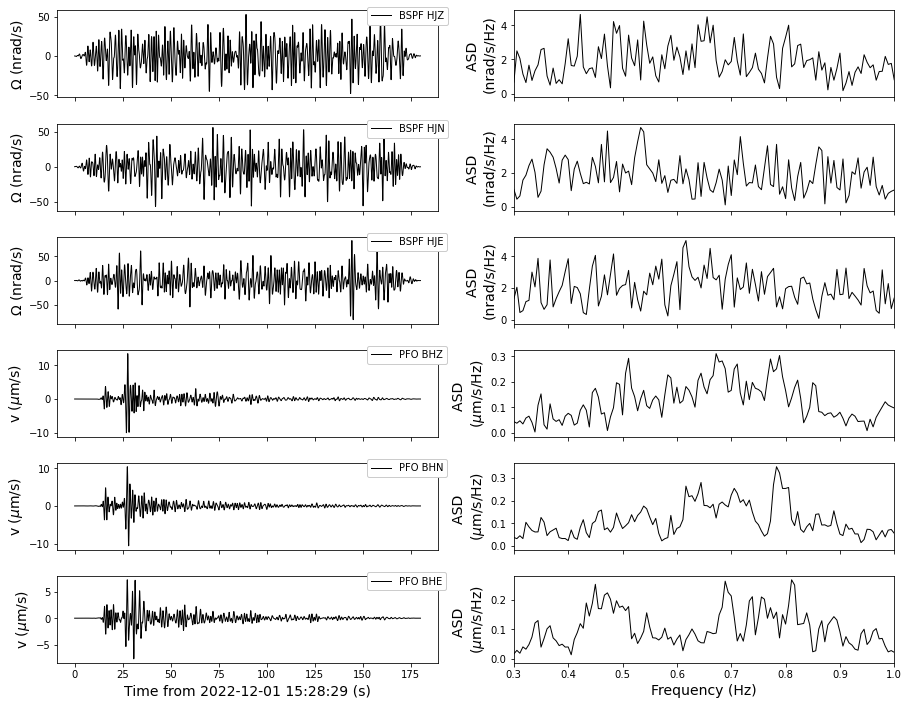

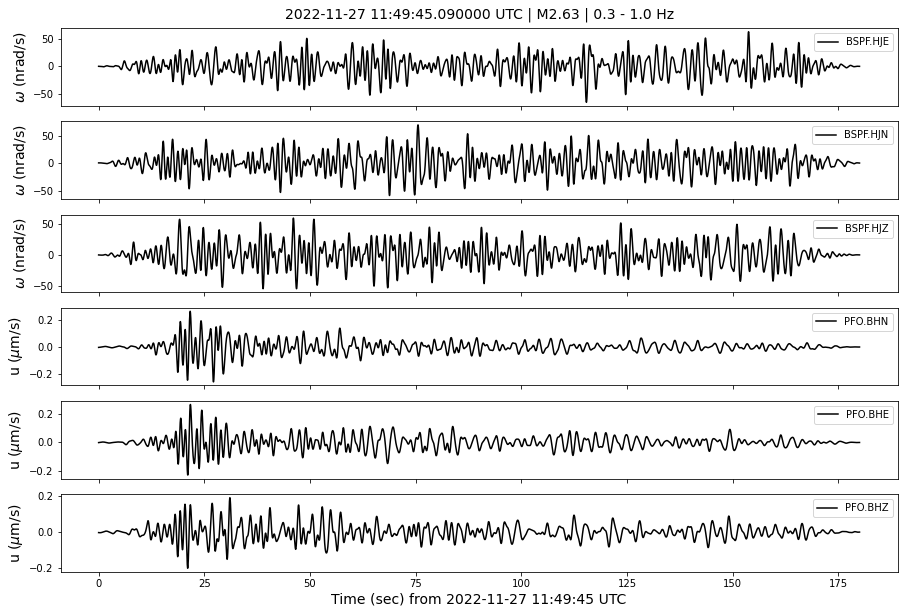


   -> saving ./figs/20221127T114945.090000_traces.png ...

   -> Done


   -> saving ./figs/20221127T114945.090000_spectra.png ...

   -> Done

 -> 18 2022-11-25 09:06:01.510000 
6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-11-25T09:06:01.511100Z - 2022-11-25T09:09:01.511100Z | 200.0 Hz, 36001 samples
PY.BSPF..HJN  | 2022-11-25T09:06:01.511100Z - 2022-11-25T09:09:01.511100Z | 200.0 Hz, 36001 samples
PY.BSPF..HJZ  | 2022-11-25T09:06:01.511100Z - 2022-11-25T09:09:01.511100Z | 200.0 Hz, 36001 samples
II.PFO.10.BHN | 2022-11-25T09:06:01.519538Z - 2022-11-25T09:09:01.519538Z | 40.0 Hz, 7201 samples
II.PFO.10.BHE | 2022-11-25T09:06:01.519538Z - 2022-11-25T09:09:01.519538Z | 40.0 Hz, 7201 samples
II.PFO.10.BHZ | 2022-11-25T09:06:01.519538Z - 2022-11-25T09:09:01.519538Z | 40.0 Hz, 7201 samples


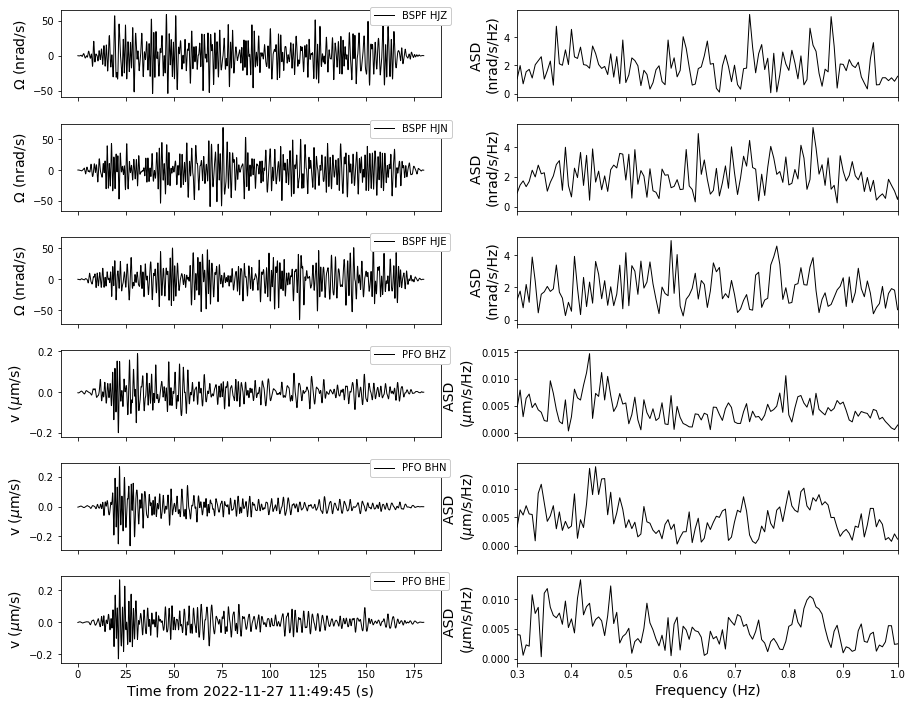

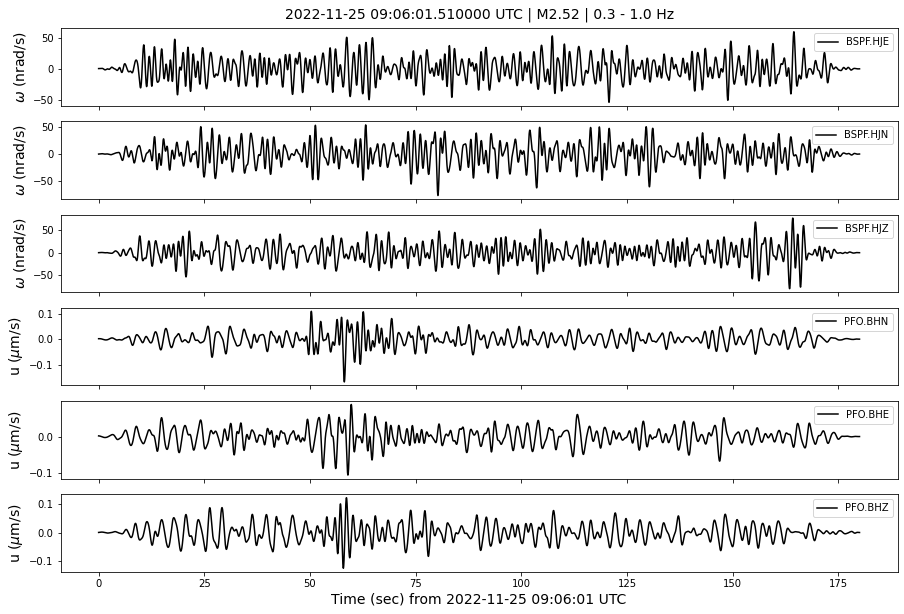


   -> saving ./figs/20221125T090601.510000_traces.png ...

   -> Done


   -> saving ./figs/20221125T090601.510000_spectra.png ...

   -> Done

 -> 19 2022-11-24 07:20:54.950000 
6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-11-24T07:20:54.951100Z - 2022-11-24T07:23:54.951100Z | 200.0 Hz, 36001 samples
PY.BSPF..HJN  | 2022-11-24T07:20:54.951100Z - 2022-11-24T07:23:54.951100Z | 200.0 Hz, 36001 samples
PY.BSPF..HJZ  | 2022-11-24T07:20:54.951100Z - 2022-11-24T07:23:54.951100Z | 200.0 Hz, 36001 samples
II.PFO.10.BHN | 2022-11-24T07:20:54.944538Z - 2022-11-24T07:23:54.944538Z | 40.0 Hz, 7201 samples
II.PFO.10.BHE | 2022-11-24T07:20:54.944538Z - 2022-11-24T07:23:54.944538Z | 40.0 Hz, 7201 samples
II.PFO.10.BHZ | 2022-11-24T07:20:54.944538Z - 2022-11-24T07:23:54.944538Z | 40.0 Hz, 7201 samples


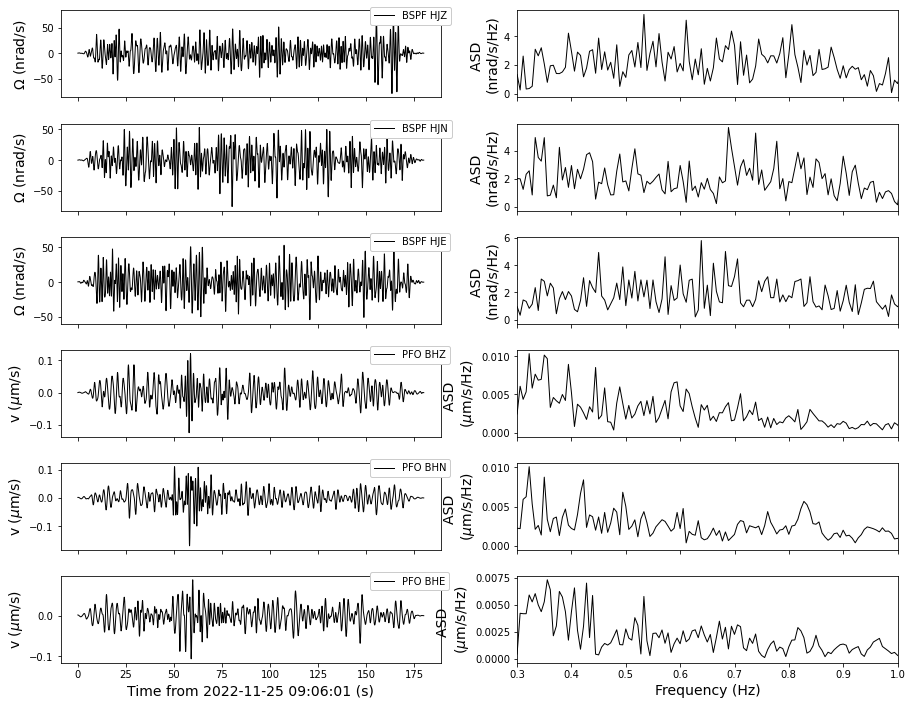

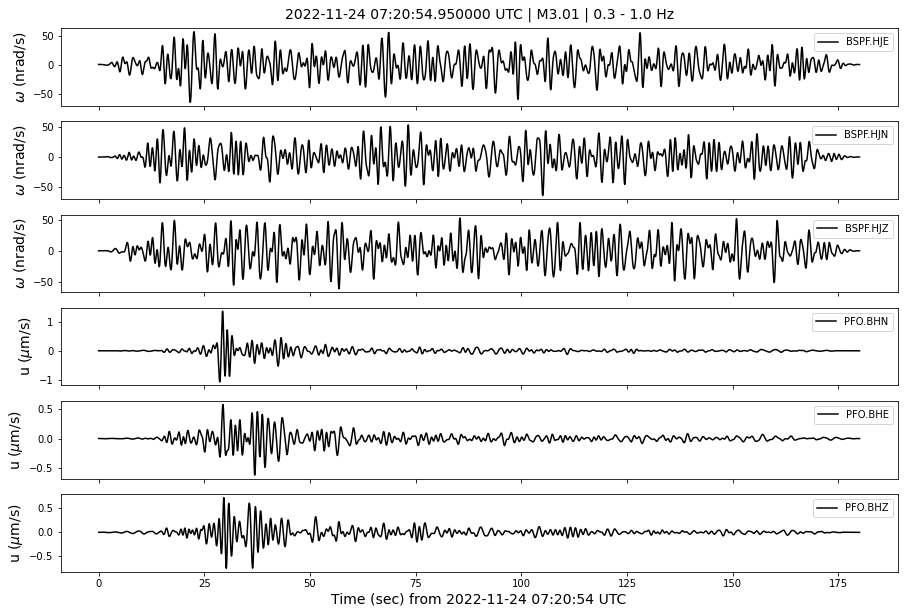


   -> saving ./figs/20221124T072054.950000_traces.png ...

   -> Done


   -> saving ./figs/20221124T072054.950000_spectra.png ...

   -> Done

 -> 20 2022-11-23 22:16:57.350000 
6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-11-23T22:16:57.351100Z - 2022-11-23T22:19:57.351100Z | 200.0 Hz, 36001 samples
PY.BSPF..HJN  | 2022-11-23T22:16:57.351100Z - 2022-11-23T22:19:57.351100Z | 200.0 Hz, 36001 samples
PY.BSPF..HJZ  | 2022-11-23T22:16:57.351100Z - 2022-11-23T22:19:57.351100Z | 200.0 Hz, 36001 samples
II.PFO.10.BHN | 2022-11-23T22:16:57.344538Z - 2022-11-23T22:19:57.344538Z | 40.0 Hz, 7201 samples
II.PFO.10.BHE | 2022-11-23T22:16:57.344538Z - 2022-11-23T22:19:57.344538Z | 40.0 Hz, 7201 samples
II.PFO.10.BHZ | 2022-11-23T22:16:57.344538Z - 2022-11-23T22:19:57.344538Z | 40.0 Hz, 7201 samples


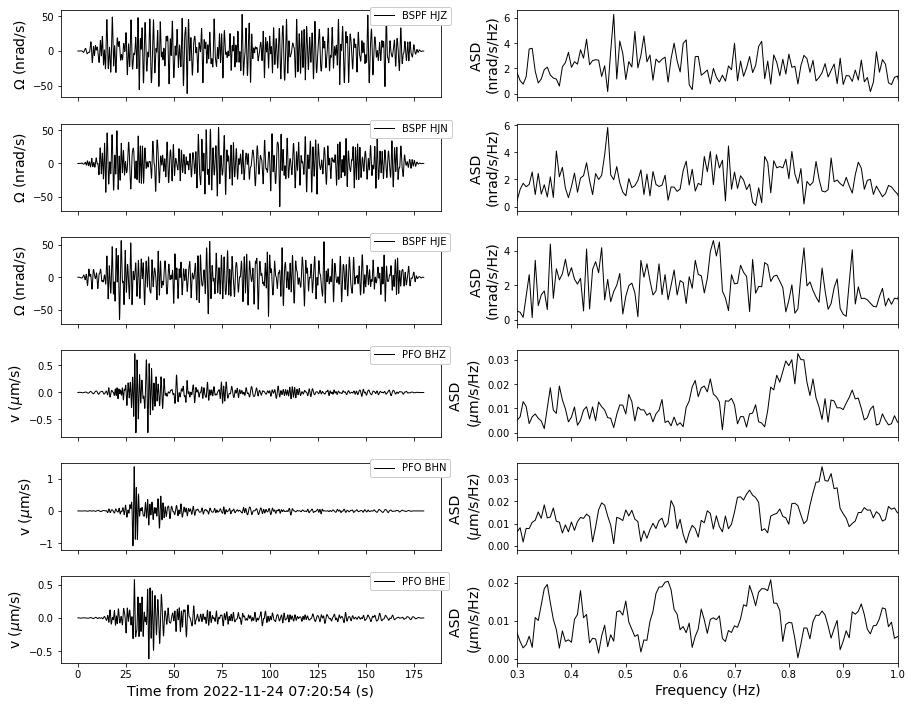

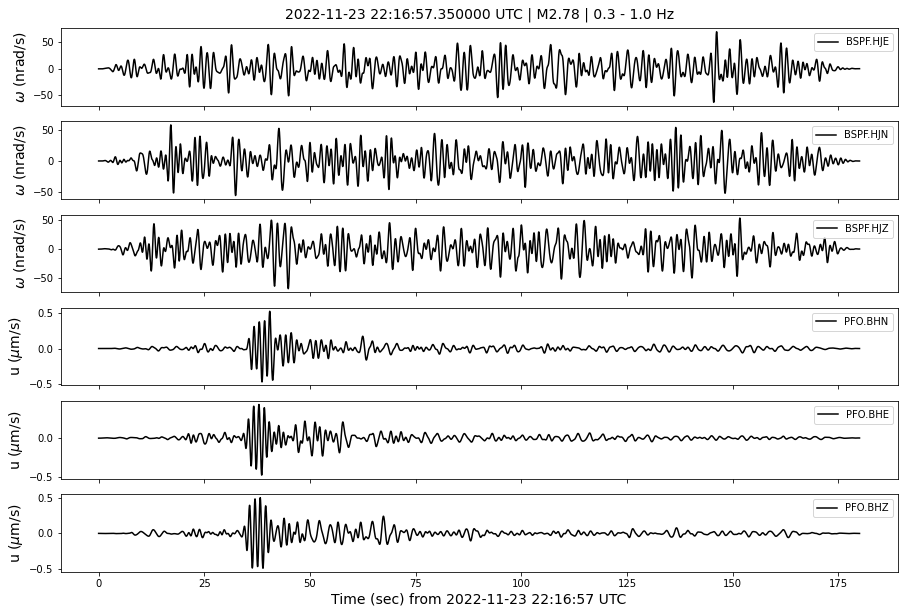


   -> saving ./figs/20221123T221657.350000_traces.png ...

   -> Done


   -> saving ./figs/20221123T221657.350000_spectra.png ...

   -> Done

 -> 21 2022-11-23 03:42:45.020000 
6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-11-23T03:42:45.021000Z - 2022-11-23T03:45:45.021000Z | 200.0 Hz, 36001 samples
PY.BSPF..HJN  | 2022-11-23T03:42:45.021000Z - 2022-11-23T03:45:45.021000Z | 200.0 Hz, 36001 samples
PY.BSPF..HJZ  | 2022-11-23T03:42:45.021000Z - 2022-11-23T03:45:45.021000Z | 200.0 Hz, 36001 samples
II.PFO.10.BHN | 2022-11-23T03:42:45.019538Z - 2022-11-23T03:45:45.019538Z | 40.0 Hz, 7201 samples
II.PFO.10.BHE | 2022-11-23T03:42:45.019538Z - 2022-11-23T03:45:45.019538Z | 40.0 Hz, 7201 samples
II.PFO.10.BHZ | 2022-11-23T03:42:45.019538Z - 2022-11-23T03:45:45.019538Z | 40.0 Hz, 7201 samples


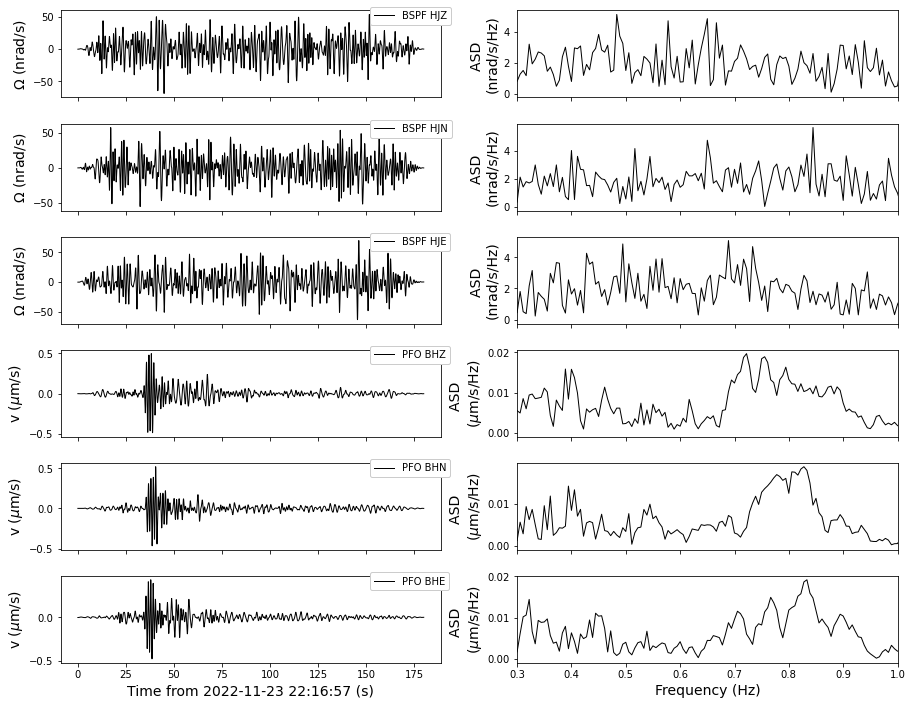

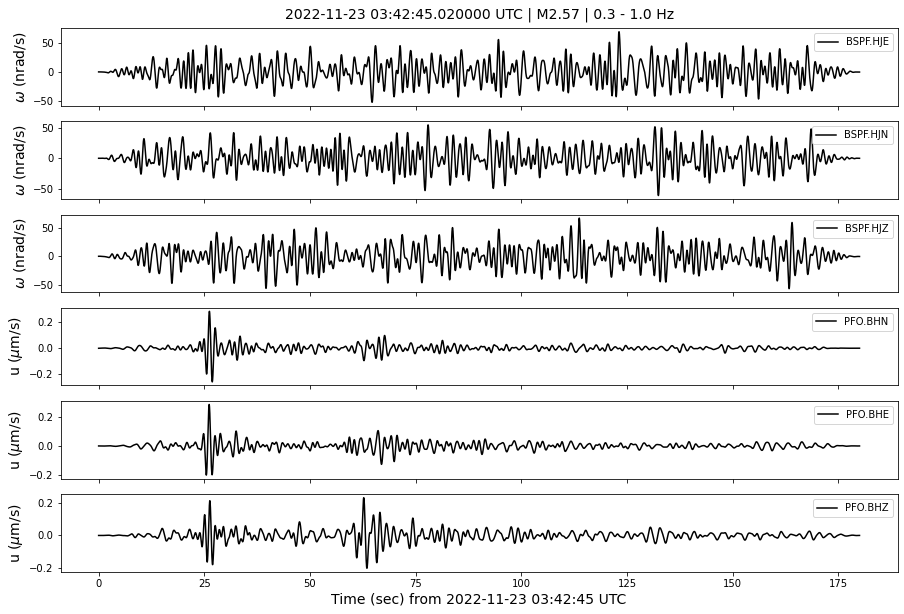


   -> saving ./figs/20221123T034245.020000_traces.png ...

   -> Done


   -> saving ./figs/20221123T034245.020000_spectra.png ...

   -> Done

 -> 22 2022-11-19 04:15:41.720000 
6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-11-19T04:15:41.721000Z - 2022-11-19T04:18:41.721000Z | 200.0 Hz, 36001 samples
PY.BSPF..HJN  | 2022-11-19T04:15:41.721000Z - 2022-11-19T04:18:41.721000Z | 200.0 Hz, 36001 samples
PY.BSPF..HJZ  | 2022-11-19T04:15:41.721000Z - 2022-11-19T04:18:41.721000Z | 200.0 Hz, 36001 samples
II.PFO.10.BHN | 2022-11-19T04:15:41.719538Z - 2022-11-19T04:18:41.719538Z | 40.0 Hz, 7201 samples
II.PFO.10.BHE | 2022-11-19T04:15:41.719538Z - 2022-11-19T04:18:41.719538Z | 40.0 Hz, 7201 samples
II.PFO.10.BHZ | 2022-11-19T04:15:41.719538Z - 2022-11-19T04:18:41.719538Z | 40.0 Hz, 7201 samples


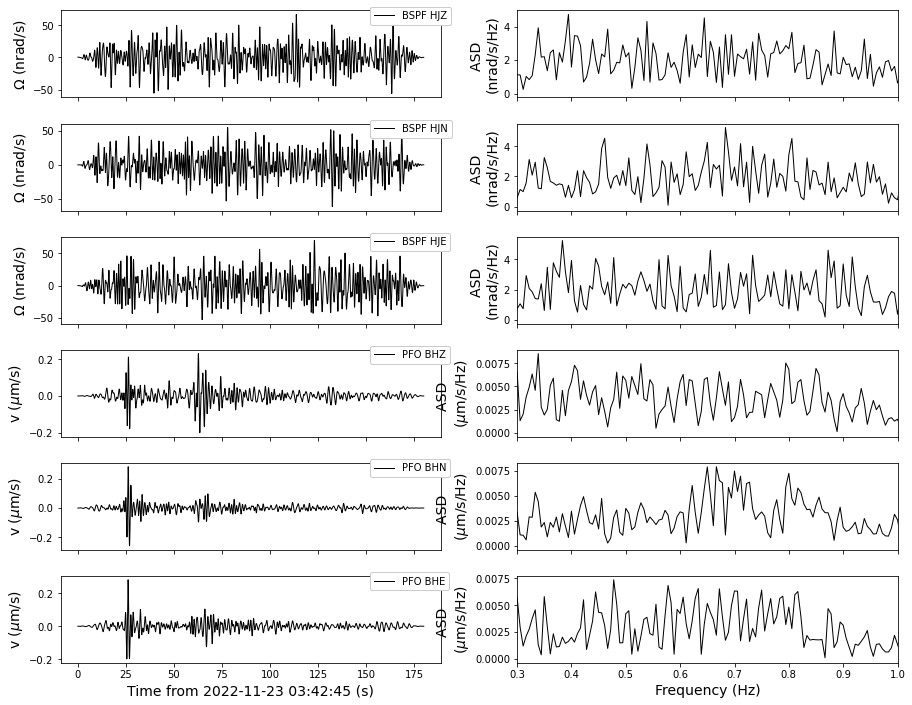

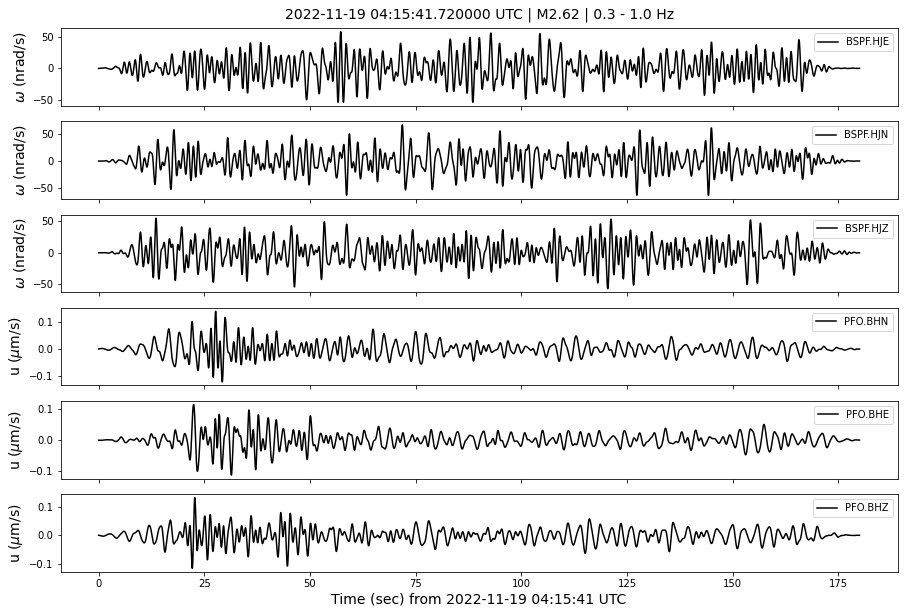


   -> saving ./figs/20221119T041541.720000_traces.png ...

   -> Done


   -> saving ./figs/20221119T041541.720000_spectra.png ...

   -> Done

 -> 23 2022-11-07 13:13:52.350000 
6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-11-07T13:13:52.351300Z - 2022-11-07T13:16:52.351300Z | 200.0 Hz, 36001 samples
PY.BSPF..HJN  | 2022-11-07T13:13:52.351300Z - 2022-11-07T13:16:52.351300Z | 200.0 Hz, 36001 samples
PY.BSPF..HJZ  | 2022-11-07T13:13:52.351300Z - 2022-11-07T13:16:52.351300Z | 200.0 Hz, 36001 samples
II.PFO.10.BHN | 2022-11-07T13:13:52.344538Z - 2022-11-07T13:16:52.344538Z | 40.0 Hz, 7201 samples
II.PFO.10.BHE | 2022-11-07T13:13:52.344538Z - 2022-11-07T13:16:52.344538Z | 40.0 Hz, 7201 samples
II.PFO.10.BHZ | 2022-11-07T13:13:52.344538Z - 2022-11-07T13:16:52.344538Z | 40.0 Hz, 7201 samples


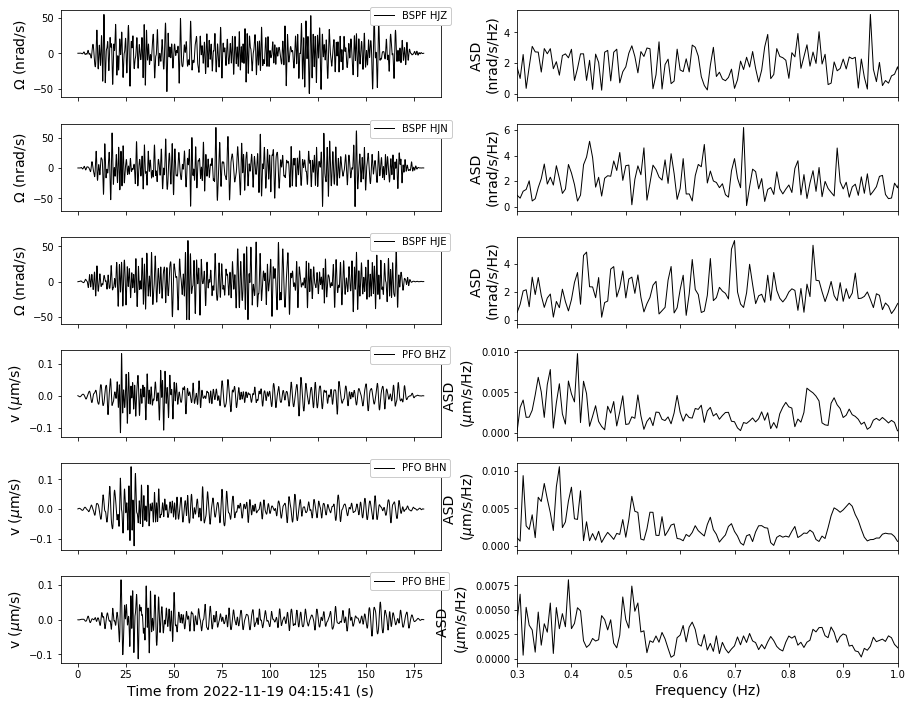

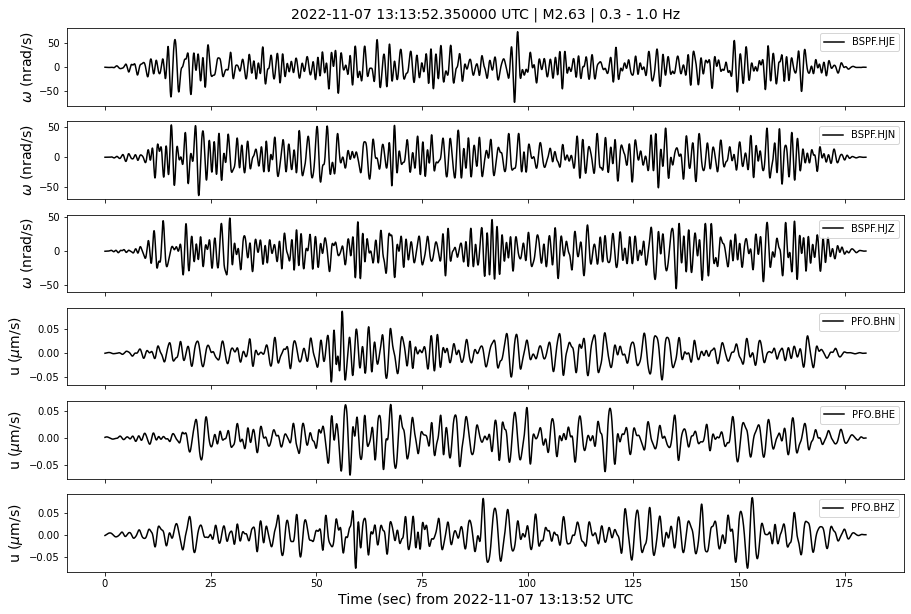


   -> saving ./figs/20221107T131352.350000_traces.png ...

   -> Done


   -> saving ./figs/20221107T131352.350000_spectra.png ...

   -> Done

 -> 24 2022-11-05 20:39:33.120000 
6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-11-05T20:39:33.121300Z - 2022-11-05T20:42:33.121300Z | 200.0 Hz, 36001 samples
PY.BSPF..HJN  | 2022-11-05T20:39:33.121300Z - 2022-11-05T20:42:33.121300Z | 200.0 Hz, 36001 samples
PY.BSPF..HJZ  | 2022-11-05T20:39:33.121300Z - 2022-11-05T20:42:33.121300Z | 200.0 Hz, 36001 samples
II.PFO.10.BHN | 2022-11-05T20:39:33.119539Z - 2022-11-05T20:42:33.119539Z | 40.0 Hz, 7201 samples
II.PFO.10.BHE | 2022-11-05T20:39:33.119539Z - 2022-11-05T20:42:33.119539Z | 40.0 Hz, 7201 samples
II.PFO.10.BHZ | 2022-11-05T20:39:33.119539Z - 2022-11-05T20:42:33.119539Z | 40.0 Hz, 7201 samples


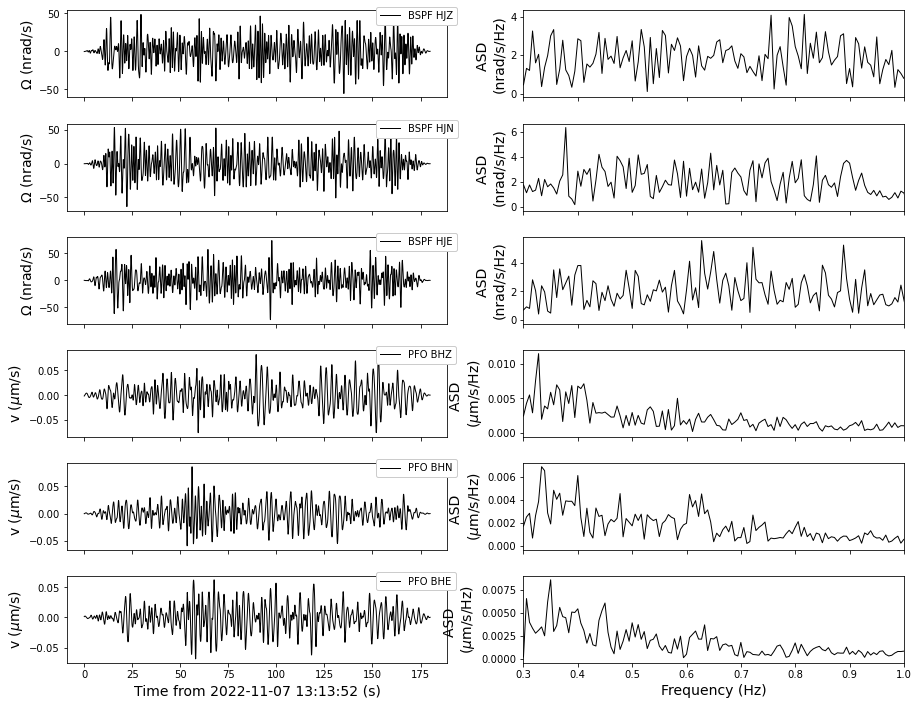

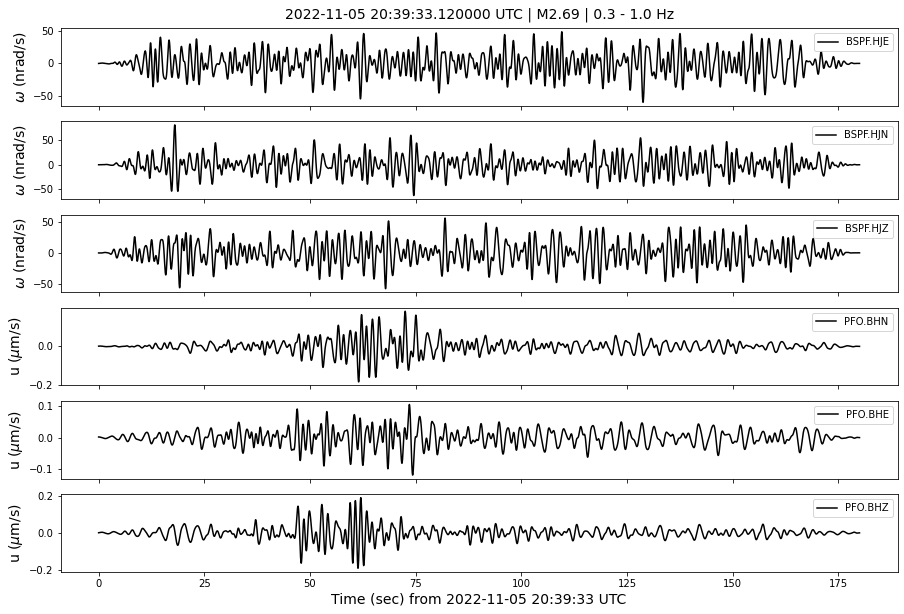


   -> saving ./figs/20221105T203933.120000_traces.png ...

   -> Done


   -> saving ./figs/20221105T203933.120000_spectra.png ...

   -> Done

 -> 25 2022-10-31 04:52:58.560000 
6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-10-31T04:52:58.561300Z - 2022-10-31T04:55:58.561300Z | 200.0 Hz, 36001 samples
PY.BSPF..HJN  | 2022-10-31T04:52:58.561300Z - 2022-10-31T04:55:58.561300Z | 200.0 Hz, 36001 samples
PY.BSPF..HJZ  | 2022-10-31T04:52:58.561300Z - 2022-10-31T04:55:58.561300Z | 200.0 Hz, 36001 samples
II.PFO.10.BHN | 2022-10-31T04:52:58.569536Z - 2022-10-31T04:55:58.569536Z | 40.0 Hz, 7201 samples
II.PFO.10.BHE | 2022-10-31T04:52:58.569536Z - 2022-10-31T04:55:58.569536Z | 40.0 Hz, 7201 samples
II.PFO.10.BHZ | 2022-10-31T04:52:58.569536Z - 2022-10-31T04:55:58.569536Z | 40.0 Hz, 7201 samples


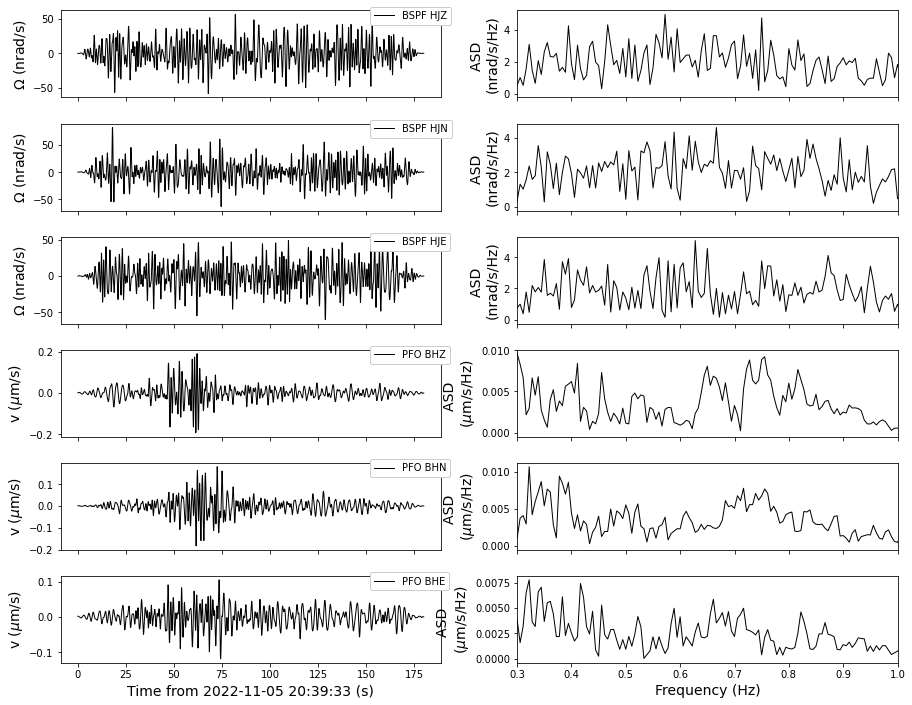

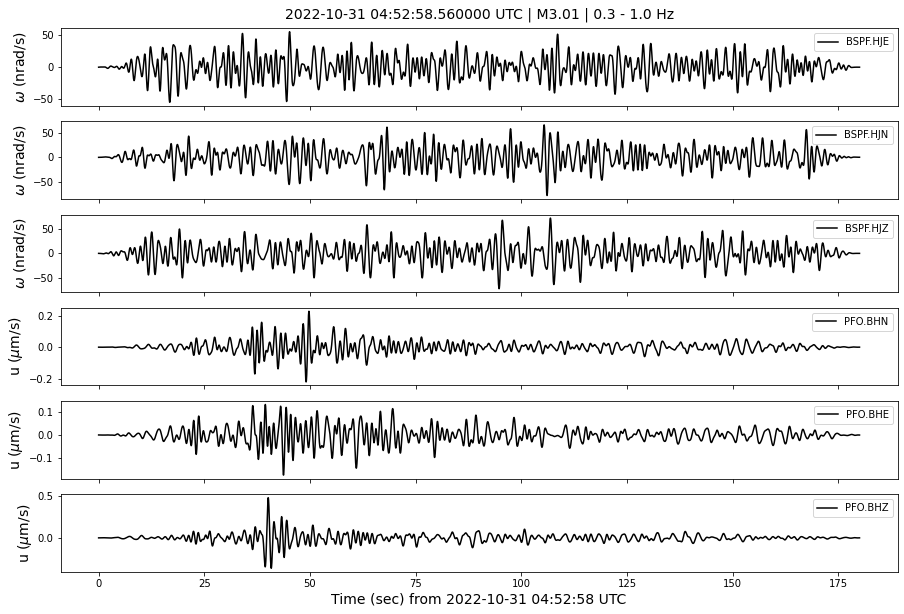


   -> saving ./figs/20221031T045258.560000_traces.png ...

   -> Done


   -> saving ./figs/20221031T045258.560000_spectra.png ...

   -> Done

 -> 26 2022-10-30 08:16:03.080000 
6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-10-30T08:16:03.081300Z - 2022-10-30T08:19:03.081300Z | 200.0 Hz, 36001 samples
PY.BSPF..HJN  | 2022-10-30T08:16:03.081300Z - 2022-10-30T08:19:03.081300Z | 200.0 Hz, 36001 samples
PY.BSPF..HJZ  | 2022-10-30T08:16:03.081300Z - 2022-10-30T08:19:03.081300Z | 200.0 Hz, 36001 samples
II.PFO.10.BHN | 2022-10-30T08:16:03.069538Z - 2022-10-30T08:19:03.069538Z | 40.0 Hz, 7201 samples
II.PFO.10.BHE | 2022-10-30T08:16:03.069538Z - 2022-10-30T08:19:03.069538Z | 40.0 Hz, 7201 samples
II.PFO.10.BHZ | 2022-10-30T08:16:03.069538Z - 2022-10-30T08:19:03.069538Z | 40.0 Hz, 7201 samples


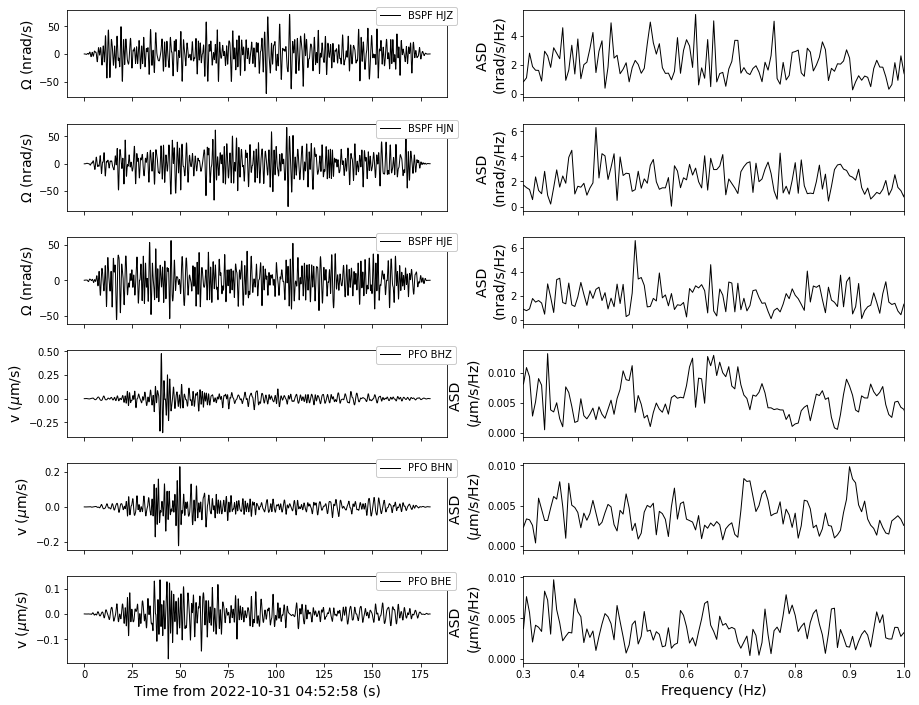

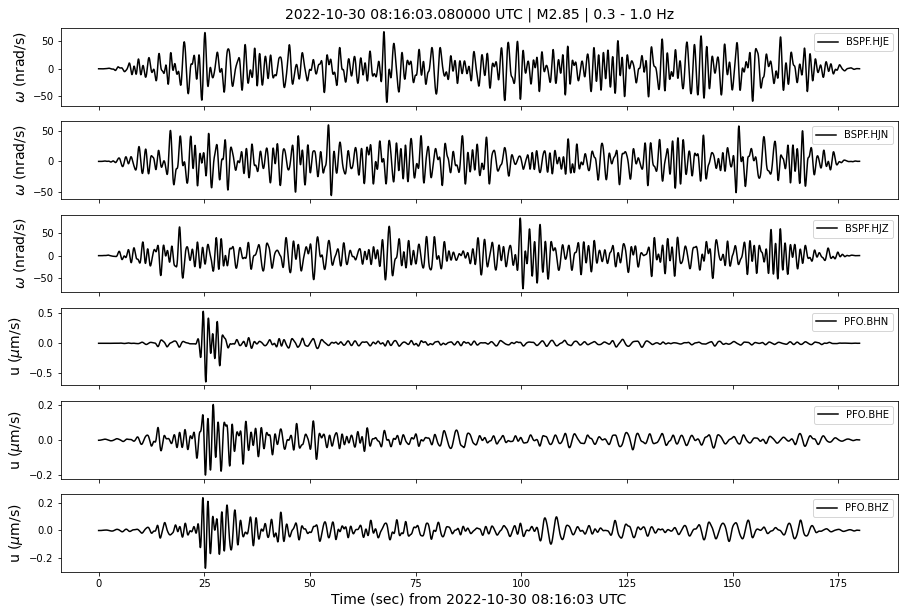


   -> saving ./figs/20221030T081603.080000_traces.png ...

   -> Done


   -> saving ./figs/20221030T081603.080000_spectra.png ...

   -> Done

 -> 27 2022-10-26 08:15:08.220000 
6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-10-26T08:15:08.220700Z - 2022-10-26T08:16:08.220700Z | 200.0 Hz, 12001 samples
PY.BSPF..HJN  | 2022-10-26T08:15:08.220700Z - 2022-10-26T08:16:08.220700Z | 200.0 Hz, 12001 samples
PY.BSPF..HJZ  | 2022-10-26T08:15:08.220700Z - 2022-10-26T08:16:08.220700Z | 200.0 Hz, 12001 samples
II.PFO.10.BHN | 2022-10-26T08:15:08.219538Z - 2022-10-26T08:16:08.219538Z | 40.0 Hz, 2401 samples
II.PFO.10.BHE | 2022-10-26T08:15:08.219538Z - 2022-10-26T08:16:08.219538Z | 40.0 Hz, 2401 samples
II.PFO.10.BHZ | 2022-10-26T08:15:08.219538Z - 2022-10-26T08:16:08.219538Z | 40.0 Hz, 2401 samples


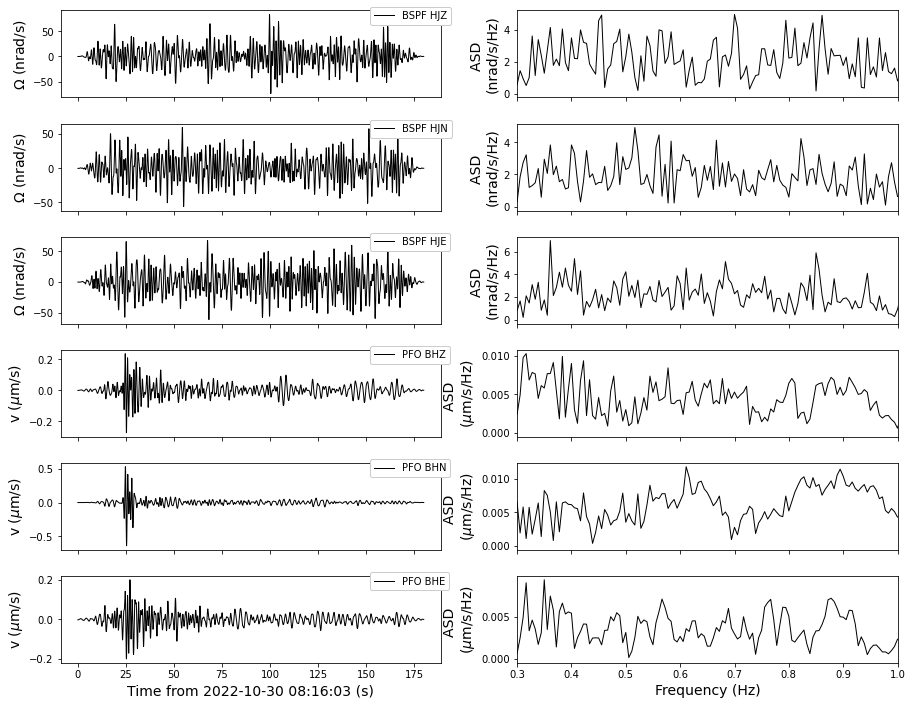

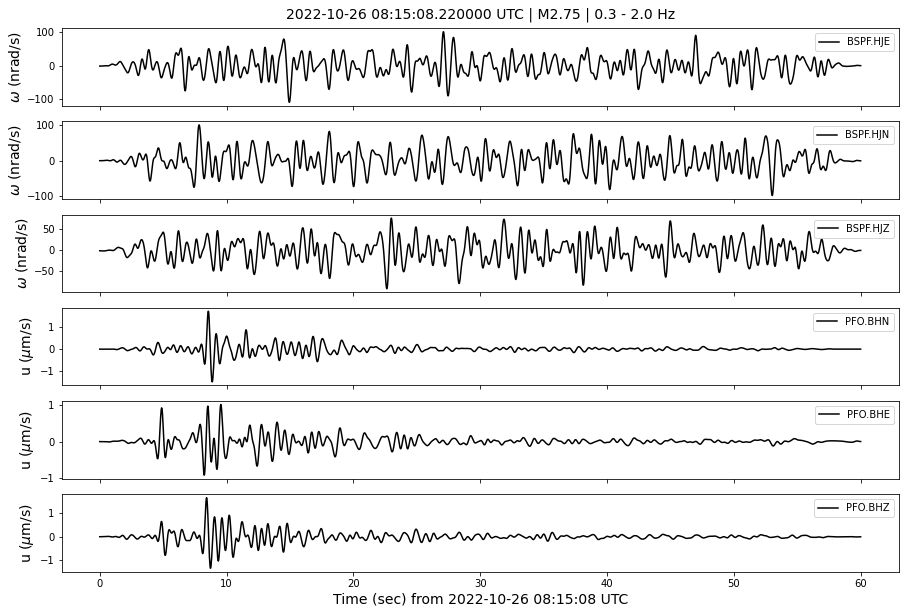


   -> saving ./figs/20221026T081508.220000_traces.png ...

   -> Done


   -> saving ./figs/20221026T081508.220000_spectra.png ...

   -> Done

 -> 28 2022-10-26 08:14:35.080000 
6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-10-26T08:14:35.080600Z - 2022-10-26T08:15:35.080600Z | 200.0 Hz, 12001 samples
PY.BSPF..HJN  | 2022-10-26T08:14:35.080600Z - 2022-10-26T08:15:35.080600Z | 200.0 Hz, 12001 samples
PY.BSPF..HJZ  | 2022-10-26T08:14:35.080600Z - 2022-10-26T08:15:35.080600Z | 200.0 Hz, 12001 samples
II.PFO.10.BHN | 2022-10-26T08:14:35.069538Z - 2022-10-26T08:15:35.069538Z | 40.0 Hz, 2401 samples
II.PFO.10.BHE | 2022-10-26T08:14:35.069538Z - 2022-10-26T08:15:35.069538Z | 40.0 Hz, 2401 samples
II.PFO.10.BHZ | 2022-10-26T08:14:35.069538Z - 2022-10-26T08:15:35.069538Z | 40.0 Hz, 2401 samples


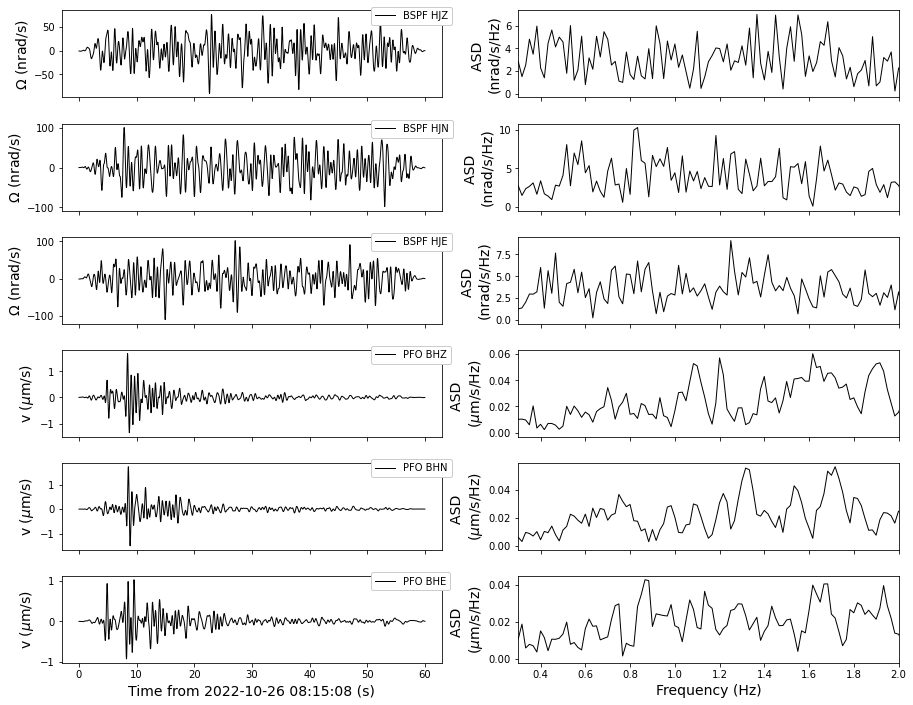

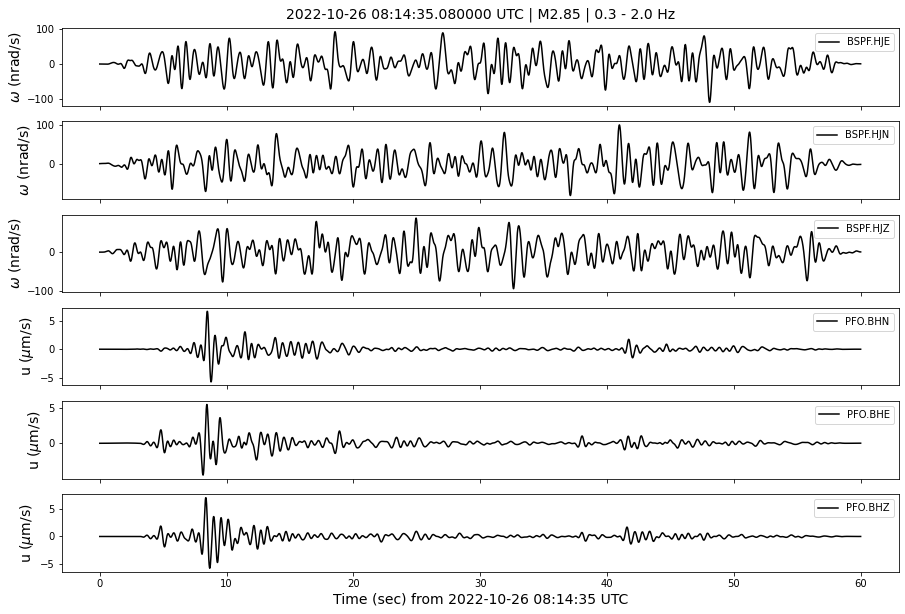


   -> saving ./figs/20221026T081435.080000_traces.png ...

   -> Done


   -> saving ./figs/20221026T081435.080000_spectra.png ...

   -> Done

 -> 29 2022-10-24 23:19:02.470000 
6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-10-24T23:19:02.468700Z - 2022-10-24T23:22:02.468700Z | 200.0 Hz, 36001 samples
PY.BSPF..HJN  | 2022-10-24T23:19:02.468700Z - 2022-10-24T23:22:02.468700Z | 200.0 Hz, 36001 samples
PY.BSPF..HJZ  | 2022-10-24T23:19:02.468700Z - 2022-10-24T23:22:02.468700Z | 200.0 Hz, 36001 samples
II.PFO.10.BHN | 2022-10-24T23:19:02.469538Z - 2022-10-24T23:22:02.469538Z | 40.0 Hz, 7201 samples
II.PFO.10.BHE | 2022-10-24T23:19:02.469538Z - 2022-10-24T23:22:02.469538Z | 40.0 Hz, 7201 samples
II.PFO.10.BHZ | 2022-10-24T23:19:02.469538Z - 2022-10-24T23:22:02.469538Z | 40.0 Hz, 7201 samples


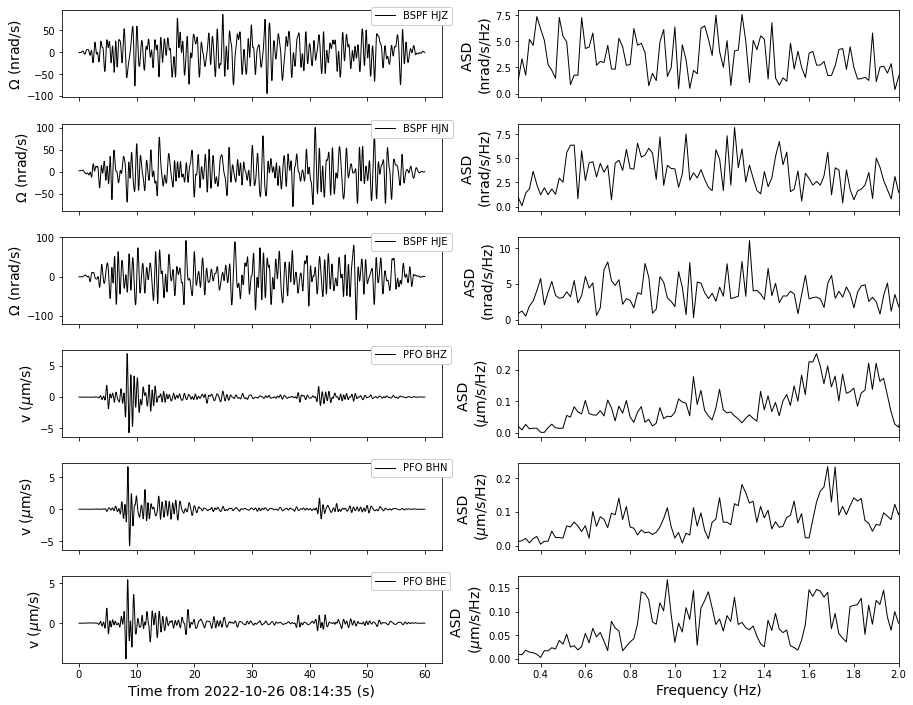

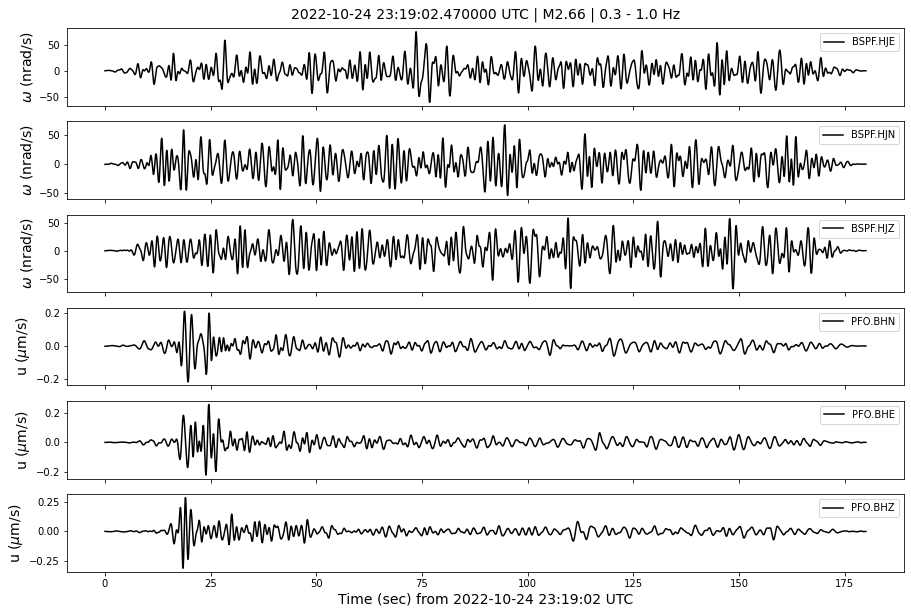


   -> saving ./figs/20221024T231902.470000_traces.png ...

   -> Done


   -> saving ./figs/20221024T231902.470000_spectra.png ...

   -> Done

 -> 30 2022-10-23 09:24:58.150000 
6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-10-23T09:24:58.148700Z - 2022-10-23T09:25:58.148700Z | 200.0 Hz, 12001 samples
PY.BSPF..HJN  | 2022-10-23T09:24:58.148700Z - 2022-10-23T09:25:58.148700Z | 200.0 Hz, 12001 samples
PY.BSPF..HJZ  | 2022-10-23T09:24:58.148700Z - 2022-10-23T09:25:58.148700Z | 200.0 Hz, 12001 samples
II.PFO.10.BHN | 2022-10-23T09:24:58.144538Z - 2022-10-23T09:25:58.144538Z | 40.0 Hz, 2401 samples
II.PFO.10.BHE | 2022-10-23T09:24:58.144538Z - 2022-10-23T09:25:58.144538Z | 40.0 Hz, 2401 samples
II.PFO.10.BHZ | 2022-10-23T09:24:58.144538Z - 2022-10-23T09:25:58.144538Z | 40.0 Hz, 2401 samples


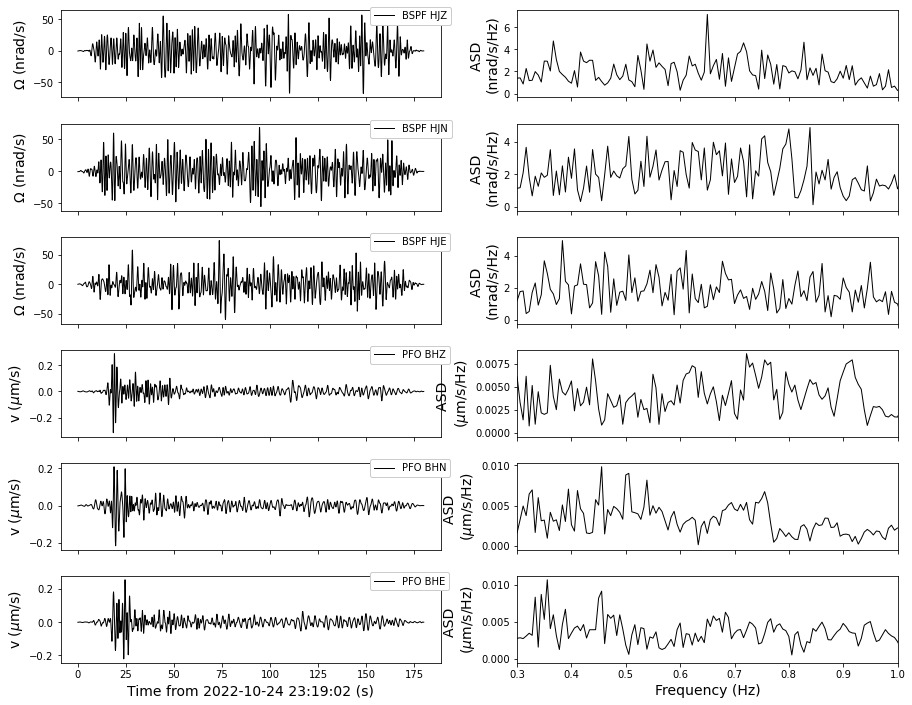

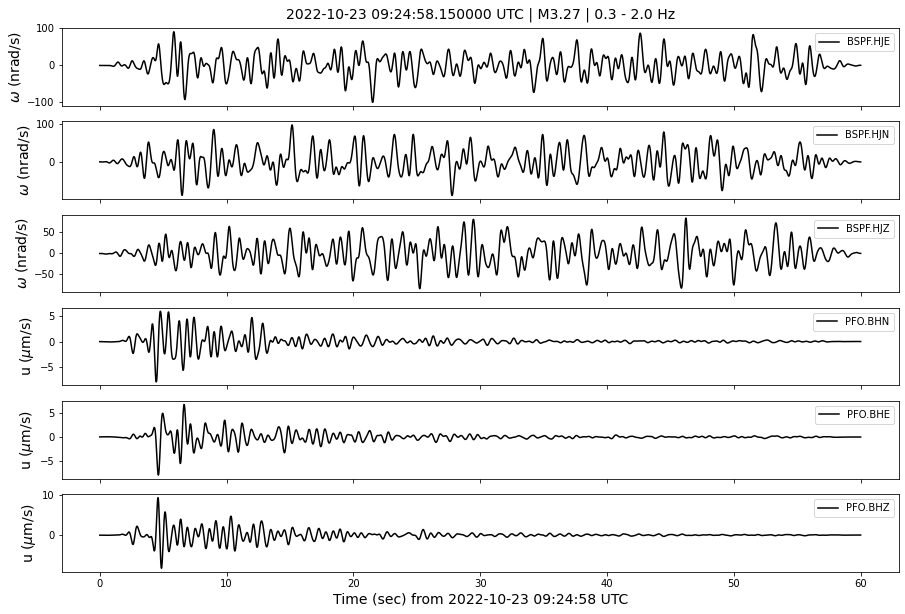


   -> saving ./figs/20221023T092458.150000_traces.png ...

   -> Done


   -> saving ./figs/20221023T092458.150000_spectra.png ...

   -> Done

 -> 31 2022-10-17 05:25:28.830000 
6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-10-17T05:25:28.828700Z - 2022-10-17T05:28:28.828700Z | 200.0 Hz, 36001 samples
PY.BSPF..HJN  | 2022-10-17T05:25:28.828700Z - 2022-10-17T05:28:28.828700Z | 200.0 Hz, 36001 samples
PY.BSPF..HJZ  | 2022-10-17T05:25:28.828700Z - 2022-10-17T05:28:28.828700Z | 200.0 Hz, 36001 samples
II.PFO.10.BHN | 2022-10-17T05:25:28.819539Z - 2022-10-17T05:28:28.819539Z | 40.0 Hz, 7201 samples
II.PFO.10.BHE | 2022-10-17T05:25:28.819539Z - 2022-10-17T05:28:28.819539Z | 40.0 Hz, 7201 samples
II.PFO.10.BHZ | 2022-10-17T05:25:28.819539Z - 2022-10-17T05:28:28.819539Z | 40.0 Hz, 7201 samples


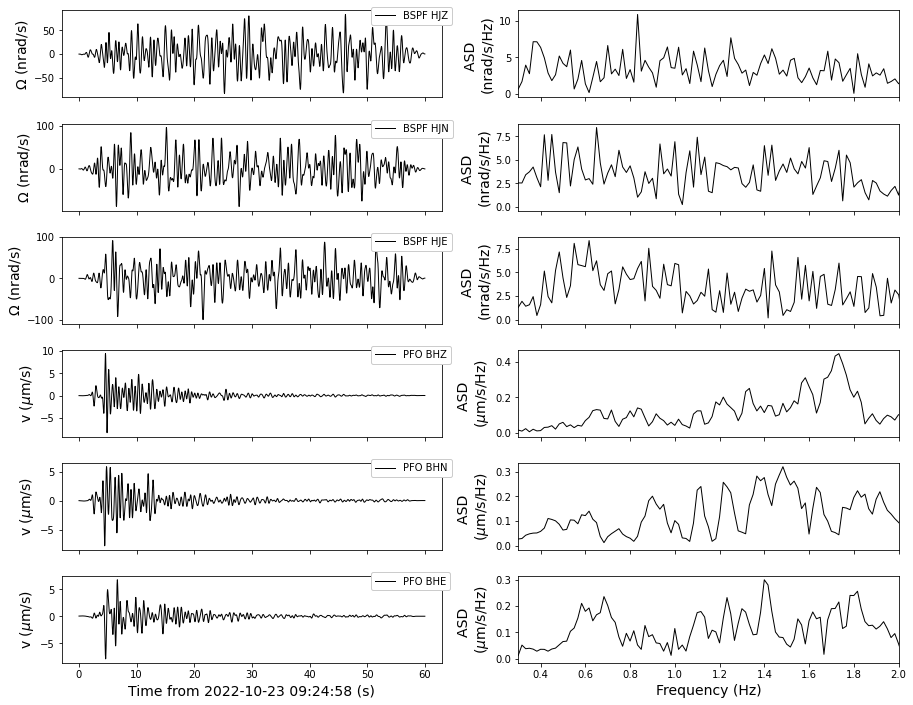

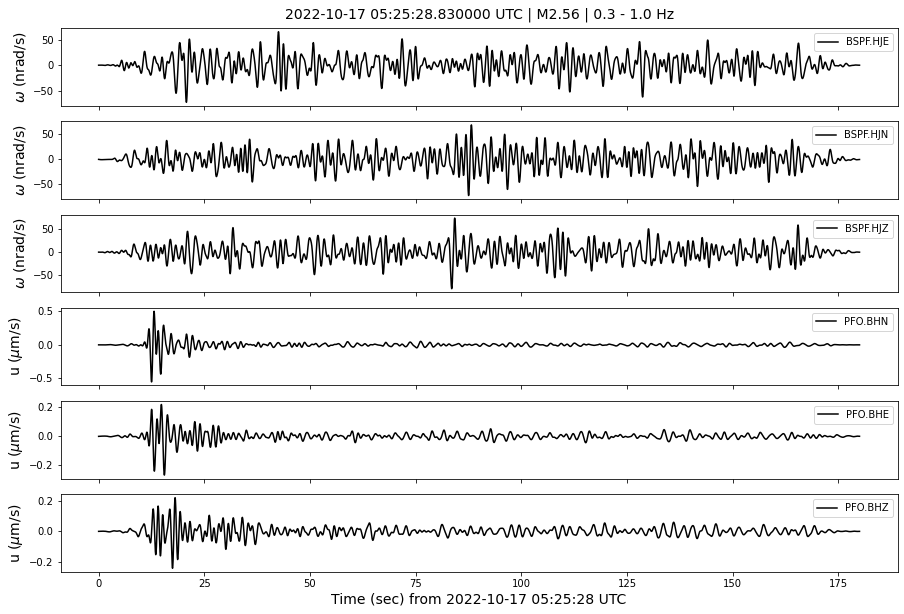


   -> saving ./figs/20221017T052528.830000_traces.png ...

   -> Done


   -> saving ./figs/20221017T052528.830000_spectra.png ...

   -> Done

 -> 32 2022-10-12 01:21:33.040000 
6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-10-12T01:21:33.042400Z - 2022-10-12T01:24:33.042400Z | 200.0 Hz, 36001 samples
PY.BSPF..HJN  | 2022-10-12T01:21:33.042400Z - 2022-10-12T01:24:33.042400Z | 200.0 Hz, 36001 samples
PY.BSPF..HJZ  | 2022-10-12T01:21:33.042400Z - 2022-10-12T01:24:33.042400Z | 200.0 Hz, 36001 samples
II.PFO.10.BHN | 2022-10-12T01:21:33.044538Z - 2022-10-12T01:24:33.044538Z | 40.0 Hz, 7201 samples
II.PFO.10.BHE | 2022-10-12T01:21:33.044538Z - 2022-10-12T01:24:33.044538Z | 40.0 Hz, 7201 samples
II.PFO.10.BHZ | 2022-10-12T01:21:33.044538Z - 2022-10-12T01:24:33.044538Z | 40.0 Hz, 7201 samples


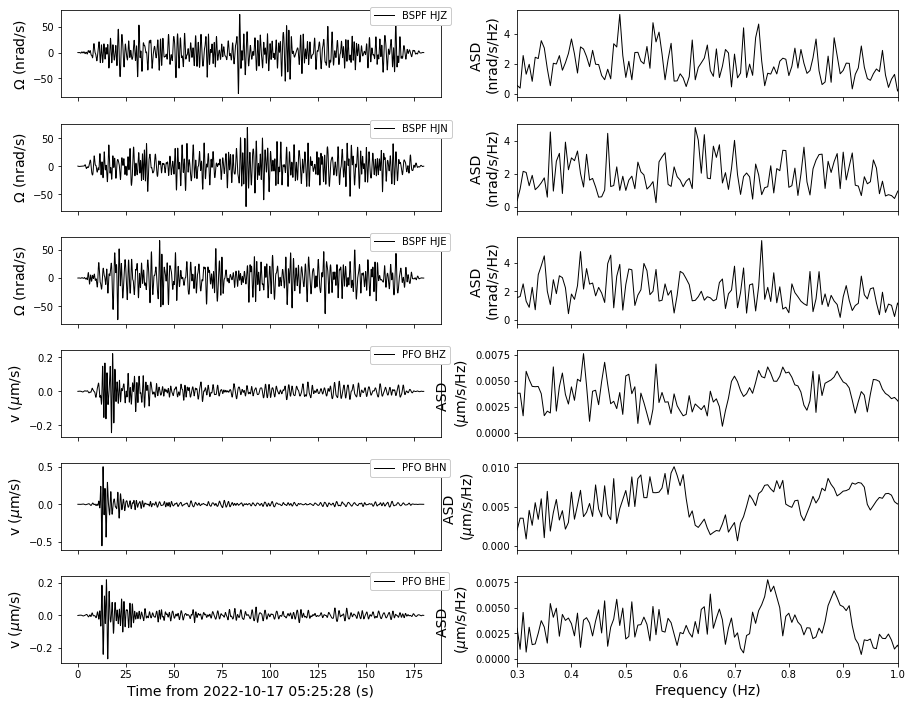

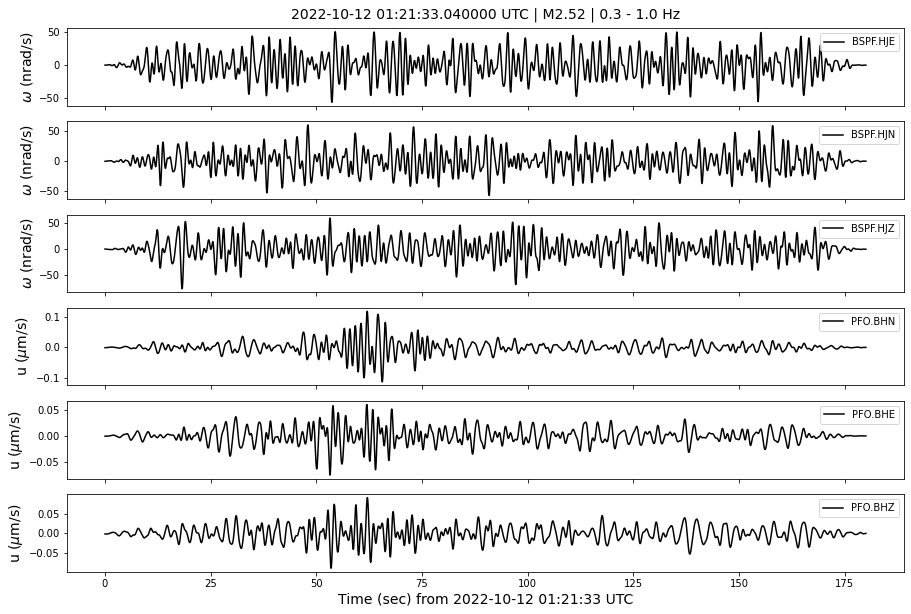


   -> saving ./figs/20221012T012133.040000_traces.png ...

   -> Done


   -> saving ./figs/20221012T012133.040000_spectra.png ...

   -> Done

 -> 33 2022-10-07 22:45:05.470000 
6 Trace(s) in Stream:
PY.BSPF..HJE  | 2022-10-07T22:45:05.472300Z - 2022-10-07T22:48:05.472300Z | 200.0 Hz, 36001 samples
PY.BSPF..HJN  | 2022-10-07T22:45:05.472300Z - 2022-10-07T22:48:05.472300Z | 200.0 Hz, 36001 samples
PY.BSPF..HJZ  | 2022-10-07T22:45:05.472300Z - 2022-10-07T22:48:05.472300Z | 200.0 Hz, 36001 samples
II.PFO.10.BHN | 2022-10-07T22:45:05.469539Z - 2022-10-07T22:48:05.469539Z | 40.0 Hz, 7201 samples
II.PFO.10.BHE | 2022-10-07T22:45:05.469539Z - 2022-10-07T22:48:05.469539Z | 40.0 Hz, 7201 samples
II.PFO.10.BHZ | 2022-10-07T22:45:05.469539Z - 2022-10-07T22:48:05.469539Z | 40.0 Hz, 7201 samples


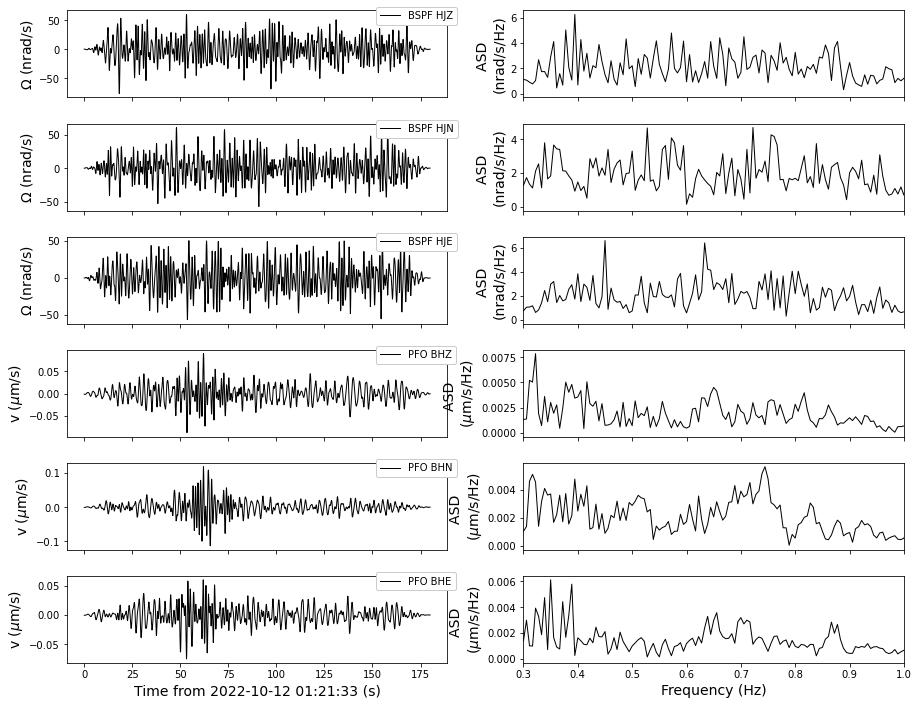

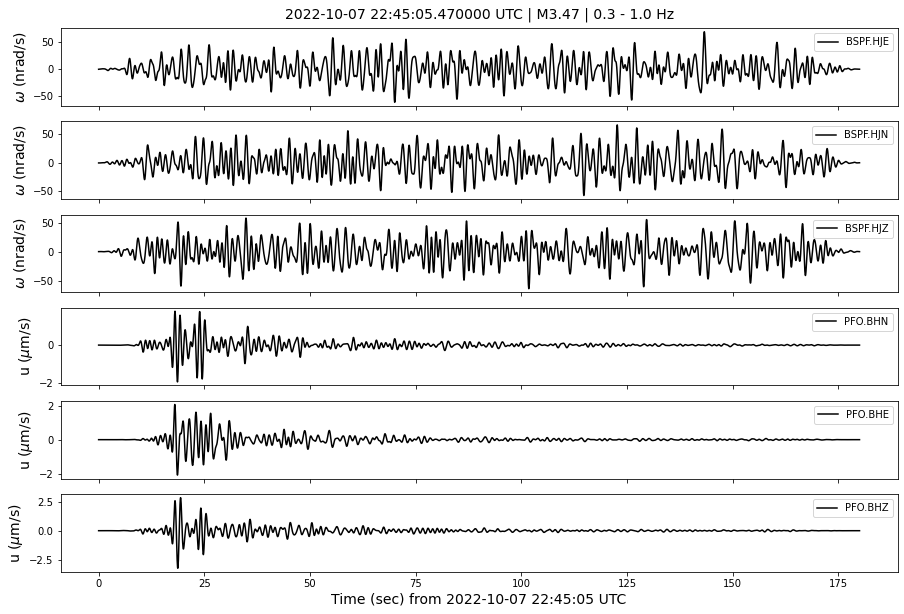


   -> saving ./figs/20221007T224505.470000_traces.png ...

   -> Done


   -> saving ./figs/20221007T224505.470000_spectra.png ...

   -> Done

 -> 34 2022-10-06 12:11:08.400000 
 -> Failed to load waveforms!


AttributeError: 'NoneType' object has no attribute 'copy'

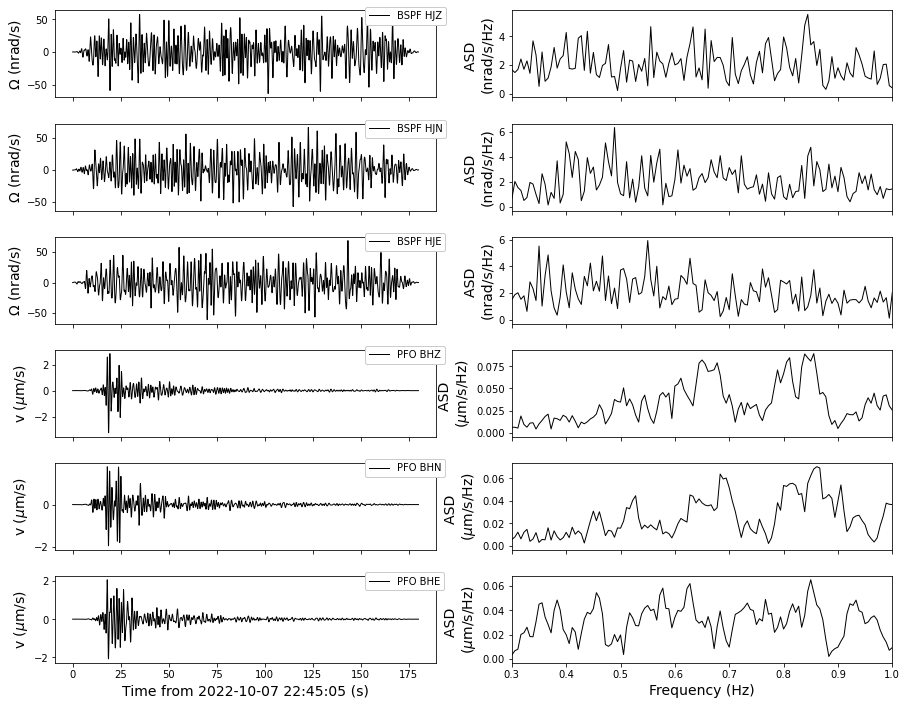

In [35]:
for jj, ev in enumerate(events.index):
# for jj, ev in enumerate([0,1]):
    
    print(f" -> {jj} {events.origin[jj]} ")
    
    config['title'] = f"{events.origin[jj]} UTC | M{events.magnitude[jj]}"
    config['tbeg'] = obs.UTCDateTime(str(events.origin[jj]))

    if events.distances_km[jj] < 30:
        config['tend'] = obs.UTCDateTime(events.origin[jj])+60*1
        config['fmin'], config['fmax'] = 0.3, 2.0
    else:
        config['tend'] = obs.UTCDateTime(events.origin[jj])+60*3
        config['fmin'], config['fmax'] = 0.3, 1.0

    ## load and process blueSeis data
    py_bspf0, py_bspf_inv = __request_data(config['seed_blueseis'], config['tbeg'], config['tend'])
    
    py_bspf = __process_bspf(config, py_bspf0, py_bspf_inv)
    
#     py_bspf.plot(equal_scale=False);
    
    
    ## load and process seismometer data
    ii_pfo0, ii_pfo_inv = __request_data(config['seed_seismometer'], config['tbeg'], config['tend'])
    
    ii_pfo = __process_xpfo(config, ii_pfo0, ii_pfo_inv)
    
#     ii_pfo.plot(equal_scale=False);

    
    st = py_bspf.copy()
    st += ii_pfo
    print(st)
    
    event_name = str(events.origin[jj]).replace("-","").replace(":","").replace(" ", "T")
    
    fig = __makeplot(config, st)
    __savefig(fig, outpath=config['outpath_figs'], outname=f"{event_name}_traces", mode="png")
    
    fig = __makeplotStreamSpectra2(st, config, fscale="linlin");
    __savefig(fig, outpath=config['outpath_figs'], outname=f"{event_name}_spectra", mode="png")

### Plotting

In [ ]:
# fig = __makeplot(config, st_new)

In [ ]:
# __savefig(fig, outpath="/home/andbro/Downloads/tmp/BSPF/", outname="BSPF_event_1", mode="png", dpi=300)

In [ ]:
# __savefig(fig, outpath="/home/andbro/Downloads/tmp/BSPF/", outname="BSPF_ASD_event_1", mode="png", dpi=300)

## Load ADR 

In [ ]:
# datapath_adr = "/home/andbro/Downloads/tmp/BSPF/adr/*.mseed"

# datapath_adr = "/home/andbro/kilauea-data/BSPF/202211/*.mseed"
datapath_adr = "/home/andbro/Downloads/tmp/BSPF/202211/*.mseed"

## read data stream using obspy routine
st_adr = obs.read( datapath_adr, 
                   format="MSEED",
                   startime=config['tbeg']-60,
                   endtime=config['tend']+60,
                 )

# ## merge traces that might be split due to data gaps or overlaps
st_adr.merge(fill_value="interpolate")

# ## cut to event
st_adr.trim(config['tbeg'], config['tend'])

# ## remove mean
st_adr.detrend("demean")

# ## apply taper
st_adr.taper(0.1)

# ## renove sensitivity
# st_adr.remove_sensitivity(config['inventory'])

## bandpass
st_adr.filter("bandpass", freqmin=config['fmin'], freqmax=config['fmax'], corners=8, zerophase=True)


# ## show all traces in data stream
print(st_adr)

st_adr.plot(equal_scale=False);

## Combine Streams

In [ ]:
st3 = st.copy()

## add traces
st3 += ii_pfo
st3 += st_adr

st3.sort()

## filter
config['fmin'], config['fmax'] = 0.5, 20.0
st3.detrend("demean")
st3.filter("bandpass", freqmin=config['fmin'], freqmax=config['fmax'], corners=8, zerophase=True)

## resample all to 40 Hz
st3.resample(40)

print(st3)
st3.plot(equal_scale=False);

In [ ]:
def __makeplotStreamSpectra2(st, config, fscale=None):

    from scipy import fftpack
    from andbro__fft import __fft
    import matplotlib.pyplot as plt

    NN = len(st)
    
    fig, axes = plt.subplots(NN,2,figsize=(15,int(NN*2)), sharex='col')

    plt.subplots_adjust(hspace=0.3)

    ## _______________________________________________

    st.sort(keys=['channel'], reverse=True)
    
    for i, tr in enumerate(st):

#         comp_fft = abs(fftpack.fft(tr.data))
#         ff       = fftpack.fftfreq(comp_fft.size, d=1/tr.stats.sampling_rate)
#         comp_fft = fftpack.fftshift(comp_fft)
#         ff, spec = ff[1:len(ff)//2], abs(fftpack.fft(tr.data)[1:len(ff)//2])

        spec, ff, ph = __fft(tr.data, tr.stats.delta, window=None, normalize=None)

        ## _________________________________________________________________
        axes[i,0].plot(
                    tr.times(),
                    tr.data,
                    color='black',
                    label='{} {}'.format(tr.stats.station, tr.stats.channel),
                    lw=1.0,
                    )


        ## _________________________________________________________________
        if fscale == "loglog":
            axes[i,1].loglog(ff, spec, color='black', lw=1.0)
        elif fscale == "loglin":
            axes[i,1].semilogx(ff, spec, color='black', lw=1.0)
        elif fscale == "linlog":
            axes[i,1].semilogy(ff, spec, color='black', lw=1.0)
        else:
            axes[i,1].plot(ff, spec, color='black', lw=1.0)         
        
        
        if tr.stats.channel[1] == "J":
            sym, unit = "$\Omega$", "rad/s"
        elif tr.stats.channel[1] == "H":
            sym, unit = "v", "m/s"
        else:
            unit = "Amplitude", "a.u."
            
        axes[i,0].set_ylabel(f'{sym} ({unit})')    
        axes[i,1].set_ylabel(f'ASD ({unit}/Hz)')        
        axes[i,0].legend(loc='upper left',bbox_to_anchor=(0.8, 1.10), framealpha=1.0)
        
#         axes[i,0].ticklabel_format(axis='y', style='sci', scilimits=(0,0))
#         axes[i,1].ticklabel_format(axis='y', style='sci', scilimits=(0,0))

    if "fmin" in config.keys() and "fmax" in config.keys():
        axes[i,1].set_xlim(config['fmin'],config['fmax'])

    axes[NN-1,0].set_xlabel(f"Time from {tr.stats.starttime.date} {str(tr.stats.starttime.time)[:8]} (s)" )     
    axes[NN-1,1].set_xlabel(f"Frequency (Hz)" )     

    return fig

fig = __makeplotStreamSpectra2(st3, config, fscale="linlin");

In [ ]:
# __savefig(fig, outpath="/home/andbro/Downloads/tmp/BSPF/", outname="BSPF_event_1", mode="png", dpi=300)

## Backazimuth

In [ ]:
config['fmin'],config['fmax'] = 0.01, 0.7

In [ ]:
ii_pfo_acc = ii_pfo0.copy()

pre_filt = [0.005, 0.01, 19, 20]

## cut properly
ii_pfo_acc.trim(config['tbeg'], config['tend'])

## demean
ii_pfo_acc.detrend("demean")

## remove response
ii_pfo_acc.remove_response(inventory=ii_pfo_inv, 
                       pre_filt=pre_filt, 
                       output="ACC",
                       water_level=60, 
                       plot=False)

## taper 
ii_pfo_acc.taper(0.1)

## bandpass
ii_pfo_acc.filter("bandpass", freqmin=config['fmin'], freqmax=config['fmax'], corners=8, zerophase=True)

## adjust channel names
for tr in ii_pfo_acc:
    if tr.stats.channel[-1] == "1":
        tr.stats.channel = str(tr.stats.channel).replace("1","N")
    if tr.stats.channel[-1] == "2":
        tr.stats.channel = str(tr.stats.channel).replace("2","E")
        

ii_pfo_acc.plot(equal_scale=False);

In [ ]:
py_bspf = py_bspf0.copy()

## merge traces that might be split due to data gaps or overlaps
py_bspf.merge(fill_value="interpolate")

## cut to event
py_bspf.trim(config['tbeg'], config['tend'])

## renove sensitivity
py_bspf.remove_sensitivity(py_bspf_inv)

## remove mean
py_bspf.detrend("demean")

## apply taper
py_bspf.taper(0.1)

## bandpass filter
py_bspf.filter("bandpass", freqmin=config['fmin'], freqmax=config['fmax'], corners=8, zerophase=True)

## adjust channel names
for tr in py_bspf:
    if tr.stats.channel[-1] == "1":
        tr.stats.channel = str(tr.stats.channel).replace("1","E")
    if tr.stats.channel[-1] == "2":
        tr.stats.channel = str(tr.stats.channel).replace("2","N")        
    if tr.stats.channel[-1] == "3":
        tr.stats.channel = str(tr.stats.channel).replace("3","Z")

## show all traces in data stream
print(py_bspf)

py_bspf.plot(equal_scale=False);

In [ ]:
from obspy import read, read_events, UTCDateTime
from obspy.clients.fdsn import Client
from obspy.geodetics.base import gps2dist_azimuth
import numpy as np

t1 = config['tbeg']+1
t2 = config['tend']-1

AC = ii_pfo_acc.trim(t1, t2)
RLAS = py_bspf.resample(40).trim(t1, t2).select(component="Z")



cat = Client("ISC").get_events(starttime=t1, endtime=t2, minmagnitude=6, catalog="ISC")
event = cat[0]

# event location from event info
source_latitude = event.origins[0].latitude
source_longitude = event.origins[0].longitude

# station location (Wettzell)
station_latitude = 33.610643
station_longitude = -116.455430

print(cat)
print(event.event_descriptions[0]['type'], ': ',event.event_descriptions[0]['text'])

In [ ]:
# theoretical backazimuth and distance
baz = gps2dist_azimuth(source_latitude, source_longitude, station_latitude, station_longitude)

print('Epicentral distance [m]: ',np.round(baz[0],1))
print('Theoretical azimuth [deg]: ', np.round(baz[1],1))
print('Theoretical backazimuth [deg]: ', np.round(baz[2],1))

In [ ]:
RLAS, AC

In [ ]:
from obspy.signal.cross_correlation import xcorr
from obspy.signal.rotate import rotate_ne_rt

sampling_rate = int(RLAS[0].stats.sampling_rate)
sec = 10  # window length for correlation
num_windows = len(RLAS[0]) // (int(sampling_rate * sec))

# estimate the Backazimuth for each time window
step = 10
backas = np.linspace(0, 360 - step, int(360 / step))
corrbaz = []
ind=None
for i_deg in range(0, len(backas)):
    for i_win in range(0, num_windows):
        corrbazz = xcorr(RLAS[0][sampling_rate * sec * i_win : sampling_rate * sec * (i_win + 1)], 
                         rotate_ne_rt(AC.select(component='N')[0].data, 
                                      AC.select(component='E')[0].data,
                                      backas[i_deg])[1][sampling_rate * sec * i_win : sampling_rate * sec * (i_win + 1)],
                                      0,
                        )
        corrbaz.append(corrbazz[1])
        
corrbaz = np.asarray(corrbaz)
corrbaz = corrbaz.reshape(len(backas), num_windows)

maxcorr = []
for l1 in range(0, num_windows):
    maxcor_r = backas[corrbaz[:, l1].argmax()]
    maxcorr.append(maxcor_r)
maxcorr = np.asarray(maxcorr)
X, Y = np.meshgrid(np.arange(0, sec * num_windows, sec), backas)

In [ ]:
from obspy.taup import TauPyModel

TauPy_model = TauPyModel('ak135')
arrivals_p = TauPy_model.get_travel_times(distance_in_degree=0.001 * baz[0] / 111.11,
                                        source_depth_in_km=event.origins[0].depth*0.001,
                                       phase_list=["P","p","Pdiff","PP","PKiKP","PKIKP","Pn","Pg"])
arrivals_s = TauPy_model.get_travel_times(distance_in_degree=0.001 * baz[0] / 111.11,
                                        source_depth_in_km=event.origins[0].depth*0.001,
                                       phase_list=["S","s","Sdiff","SS","SKiKS","SKIKS","Sn","Sg"])
tiemp = []
tiems = []
for i in range(0,len(arrivals_p)): tiemp.append(arrivals_p[i].time)
for ii in range(0,len(arrivals_s)): tiems.append(arrivals_s[ii].time)

# first arrivals
arriv_p = min(tiemp)
arriv_s = min(tiems)

In [ ]:
import matplotlib as mpl

plt.figure(figsize=(15,10))

time = np.linspace(0, len(AC[0].data)/sampling_rate,len(AC[0].data)) ## Time-array
# vertical rotation rate
plt.subplot2grid((3, 30), (0, 0), colspan=29)
plt.plot(time, RLAS[0].data,label='vertical rotation rate')
plt.xlim(0, time[-1])
plt.ylabel('vert. rot. rate \n[nrad/s]')
plt.legend()

# add P- and S-wave arrivals
# plt.axvline(arriv_p);plt.annotate('P-arrival', xy=(arriv_p+20,np.max(RLAS[0].data)),xycoords='data');
# plt.axvline(arriv_s);plt.annotate('S-arrival', xy=(arriv_s+20,np.max(RLAS[0].data)),xycoords='data');

# transverse acceleration
plt.subplot2grid((3, 30), (1, 0), colspan=29)
plt.plot(time, AC[0].data, 'k',label='transverse acceleration')
plt.xlim(0, time[-1])
plt.ylabel('transv. acc. \n[$nm/s^2$]')
plt.ticklabel_format(axis='y', style='sci', scilimits=(-2,2))
plt.legend()
# plt.axvline(arriv_p)
# plt.axvline(arriv_s)

# backazimuth estimation plot
plt.subplot2grid((3, 30), (2, 0), colspan=29)
im = plt.pcolor(X, Y, corrbaz, cmap=plt.cm.RdYlGn_r, vmin=-1,vmax=1)
plt.plot(np.arange(sec/2., sec * num_windows, sec), maxcorr, '.k')
plt.xlim(0, time[-1])
plt.ylim(0, 360)
plt.ylabel(u'estimated \nbackazimuth [°]')
plt.xlabel('time [s]')

# plot theoretical Backazimuth for comparison
xx = np.arange(0, sec * num_windows + 1, sec)
tba = np.ones(len(xx)) * baz[2]
plt.plot(xx, tba, c='.5', lw=1.5)
plt.text(1400, 106, u'Theor. BAz = '+str(round(baz[2],2))+'°', color='k',fontsize=12,backgroundcolor='.9')


# add colorbar
fig = plt.subplot2grid((3, 30), (2, 29))
norm = mpl.colors.Normalize(vmin=-1, vmax=1)
cb1 = mpl.colorbar.ColorbarBase(fig, cmap=plt.cm.RdYlGn_r, norm=norm, orientation='vertical')